# Setup environment

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime
from pytz import timezone
import copy
import pathlib

from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import train_test_split

try:
    import lightgbm as lgb
except:
    print("lightgbm is not installed")

DATA_DIR = "/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/merged-data/by-station"
STATION_IDS = [211, 212, 213, 214, 215, 216]

CMAQDATA_DIR = "/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/concentration_station"

PM_COLS = [
    "NO2_quantrac",
    "PM25_quantrac",
    "O3_quantrac",
    "CO_quantrac",
    "Temperature_quantrac",
    "Humid_quantrac",
]

CMAQ_COLS = [
    "NO2_cmaq",
    "O3_cmaq",
    "SO2_cmaq"
]

BASE_FEATURE_COLS = PM_COLS + CMAQ_COLS

# Define lag and rolling windows for feature engineering
LAG_STEPS = [3, 6, 12, 24]
ROLL_WINDOWS = [3, 6, 12, 24]

# Define horizon (= n_past = n_future)
HORIZONS = [1, 24, 48, 72]

RANDOM_STATE = 42

# Directory to save the results and meta data
LIGHTGBM_DIR = f"/le_thanh_van_118/workspace/hiep_workspace/lightgbm_results/{datetime.now(timezone('Asia/Saigon')).strftime('%Y_%m_%d-%H_%M_%S')}"
pathlib.Path(LIGHTGBM_DIR).mkdir(parents=True, exist_ok=True)
print(LIGHTGBM_DIR)
with open(os.path.join(LIGHTGBM_DIR, "CONFIGURATIONS.txt"), "w") as f:
    f.write(f"BASE_FEATURE_COLS: {BASE_FEATURE_COLS}\n")
    f.write(f"LAG_STEPS: {LAG_STEPS}\n")
    f.write(f"ROLL_WINDOWS: {ROLL_WINDOWS}\n")
    f.write(f"HORIZONS: {HORIZONS}\n")
    f.write(f"RANDOM_STATE: {RANDOM_STATE}\n")

/le_thanh_van_118/workspace/hiep_workspace/lightgbm_results/2025_12_11-15_45_14


# Load dataset

## Method

In [2]:
def load_station_csv(station_id, data_dir=DATA_DIR):
    csv_path = os.path.join(data_dir, f"{station_id}.csv")
    df = pd.read_csv(csv_path)

    # Convert to datetime
    if "date" in df.columns:
        df["date"] = pd.to_datetime(df["date"])
    elif "Date" in df.columns and "Time" in df.columns:
        df["date"] = pd.to_datetime((df["Date"] + " " + df["Time"]).astype('datetime64[ns]'), format="%y/%m/%d %H:%M:%S")
        df = df.drop(columns=["Date", "Time"])
    df = df.sort_values("date").reset_index(drop=True)

    # Remove "Unnamed" column
    for c in df.columns:
        if "Unnamed:" in c:
            df = df.drop(columns=[c])

    # Add station_id column
    if "Station" not in df.columns:
        df["station_id"] = station_id
    else:
        df = df.rename({"Station": "station_id"}, axis=1)
    return df

## CMAQ data

In [3]:
# Load dataset
dfs_cmaq = []
for sid in STATION_IDS:
    df_sid = load_station_csv(sid, CMAQDATA_DIR)
    dfs_cmaq.append(df_sid)
df_cmaq = pd.concat(dfs_cmaq, ignore_index=True)

# Rename columns
df_cmaq = df_cmaq.rename({c: f"{c}_cmaq" for c in df_cmaq.columns if c not in ["date", "station_id"]}, axis=1)

# Sort data by station then date
df_cmaq = df_cmaq.sort_values(["station_id", "date"]).reset_index(drop=True)

# Remove uncessary features
df_cmaq = df_cmaq.loc[:, ["date"] + CMAQ_COLS + ["station_id"]]

display(df_cmaq)

# Convert unit
df_cmaq["NO2_cmaq"] = df_cmaq["NO2_cmaq"] * 1883.2
df_cmaq["O3_cmaq"] = df_cmaq["O3_cmaq"] * 1960
df_cmaq["SO2_cmaq"] = df_cmaq["SO2_cmaq"] * 2620

print(df_cmaq.shape)
print(df_cmaq.columns)
df_cmaq

,date,NO2_cmaq,O3_cmaq,SO2_cmaq,station_id
0,2022-01-01 07:00:00,0.000072,0.096425,0.000027,211
1,2022-01-01 08:00:00,0.000074,0.077419,0.000038,211
2,2022-01-01 09:00:00,0.000055,0.061006,0.000050,211
3,2022-01-01 10:00:00,0.000040,0.048525,0.000057,211
4,2022-01-01 11:00:00,0.000034,0.029449,0.000047,211
...,...,...,...,...,...
44851,2022-12-31 01:00:00,0.002276,0.026421,0.000149,216
44852,2022-12-31 02:00:00,0.002208,0.026171,0.000148,216
44853,2022-12-31 03:00:00,0.002249,0.026087,0.000151,216
44854,2022-12-31 04:00:00,0.002680,0.026347,0.000166,216


(44856, 5)
Index(['date', 'NO2_cmaq', 'O3_cmaq', 'SO2_cmaq', 'station_id'], dtype='object')


,date,NO2_cmaq,O3_cmaq,SO2_cmaq,station_id
0,2022-01-01 07:00:00,0.136344,188.993157,0.071526,211
1,2022-01-01 08:00:00,0.138604,151.741122,0.100084,211
2,2022-01-01 09:00:00,0.104141,119.571595,0.130476,211
3,2022-01-01 10:00:00,0.075893,95.109490,0.149078,211
4,2022-01-01 11:00:00,0.063087,57.721016,0.122092,211
...,...,...,...,...,...
44851,2022-12-31 01:00:00,4.285888,51.784937,0.389183,216
44852,2022-12-31 02:00:00,4.157322,51.295325,0.386550,216
44853,2022-12-31 03:00:00,4.235773,51.130547,0.394695,216
44854,2022-12-31 04:00:00,5.047855,51.640614,0.435544,216


## PM data

In [4]:
# Load dataset
dfs_pm = []
for sid in STATION_IDS:
    df_sid = load_station_csv(sid, DATA_DIR)
    dfs_pm.append(df_sid)
df_pm = pd.concat(dfs_pm, ignore_index=True)

# Sort data by station then date
df_pm = df_pm.sort_values(["station_id", "date"]).reset_index(drop=True)

# Remove uncessary features
df_pm = df_pm.loc[:, ["date"] + PM_COLS + ["station_id"]]

print(df_pm.shape)
print(df_pm.columns)
df_pm

(92966, 8)
Index(['date', 'NO2_quantrac', 'PM25_quantrac', 'O3_quantrac', 'CO_quantrac',
       'Temperature_quantrac', 'Humid_quantrac', 'station_id'],
      dtype='object')


,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,station_id
0,2021-02-23 21:00:00,112.740762,15.604762,55.431381,90.000000,28.361905,63.188095,211
1,2021-02-23 22:00:00,112.366471,14.594118,58.197176,1200.603529,28.320588,63.773529,211
2,2021-02-23 23:00:00,112.700433,13.436667,55.029433,1177.897000,28.336667,64.205000,211
3,2021-02-24 00:00:00,112.480867,12.365000,54.767700,90.000000,28.305000,64.735000,211
4,2021-02-24 01:00:00,114.331500,11.636667,53.786200,90.000000,28.300000,65.188333,211
...,...,...,...,...,...,...,...,...
92961,2022-12-31 19:00:00,0.088233,41.450000,75.916667,2.087167,27.690000,67.290000,216
92962,2022-12-31 20:00:00,0.083217,50.530000,66.116667,2.006500,27.401667,68.026667,216
92963,2022-12-31 21:00:00,0.084300,55.055000,55.133333,2.418833,27.603333,66.965000,216
92964,2022-12-31 22:00:00,0.066650,26.078333,46.750000,1.481500,27.036667,63.361667,216


## Merge 2 data

In [5]:
dfs_all = []
for station in STATION_IDS:
    df_pm_station = df_pm[df_pm["station_id"] == station]
    df_cmaq_station = df_cmaq[df_cmaq["station_id"] == station]
    df_joined = pd.merge(df_pm_station.drop(columns=["station_id"]), df_cmaq_station, on='date', how='inner')
    dfs_all.append(df_joined)
df_all = pd.concat(dfs_all, axis=0).reset_index(drop=True)
df_all

,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,NO2_cmaq,O3_cmaq,SO2_cmaq,station_id
0,2022-01-01 07:00:00,90.000000,22.783333,35.588975,756.627400,24.661667,73.355000,0.136344,188.993157,0.071526,211
1,2022-01-01 08:00:00,90.000000,21.883333,55.011077,749.102000,27.258333,65.521667,0.138604,151.741122,0.100084,211
2,2022-01-01 09:00:00,90.000000,16.233333,64.729197,727.519000,29.250000,57.910000,0.104141,119.571595,0.130476,211
3,2022-01-01 10:00:00,90.000000,15.700000,75.109218,721.196900,30.676667,53.673333,0.075893,95.109490,0.149078,211
4,2022-01-01 11:00:00,74.207348,15.650000,77.767804,722.056400,32.168333,49.080000,0.063087,57.721016,0.122092,211
...,...,...,...,...,...,...,...,...,...,...,...
43370,2022-12-31 01:00:00,0.049037,17.709259,31.425926,0.824074,26.659259,64.601852,4.285888,51.784937,0.389183,216
43371,2022-12-31 02:00:00,0.063288,22.803390,43.220339,0.717627,25.771186,66.067797,4.157322,51.295325,0.386550,216
43372,2022-12-31 03:00:00,0.069050,23.031667,48.866667,0.746167,25.178333,68.278333,4.235773,51.130547,0.394695,216
43373,2022-12-31 04:00:00,0.064600,22.331667,50.633333,0.617667,24.950000,68.225000,5.047855,51.640614,0.435544,216


In [6]:
df_all.isnull().sum()

date                        0
NO2_quantrac            27391
PM25_quantrac           27393
O3_quantrac             30277
CO_quantrac             27407
Temperature_quantrac    35140
Humid_quantrac          35140
NO2_cmaq                    0
O3_cmaq                     0
SO2_cmaq                    0
station_id                  0
dtype: int64

# Data preparation

## Drop missing

Output: df_dropped

In [7]:
df_dropped = df_all.dropna().reset_index(drop=True)
df_dropped

,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,NO2_cmaq,O3_cmaq,SO2_cmaq,station_id
0,2022-01-01 07:00:00,90.000000,22.783333,35.588975,756.627400,24.661667,73.355000,0.136344,188.993157,0.071526,211
1,2022-01-01 08:00:00,90.000000,21.883333,55.011077,749.102000,27.258333,65.521667,0.138604,151.741122,0.100084,211
2,2022-01-01 09:00:00,90.000000,16.233333,64.729197,727.519000,29.250000,57.910000,0.104141,119.571595,0.130476,211
3,2022-01-01 10:00:00,90.000000,15.700000,75.109218,721.196900,30.676667,53.673333,0.075893,95.109490,0.149078,211
4,2022-01-01 11:00:00,74.207348,15.650000,77.767804,722.056400,32.168333,49.080000,0.063087,57.721016,0.122092,211
...,...,...,...,...,...,...,...,...,...,...,...
8228,2022-12-31 01:00:00,0.049037,17.709259,31.425926,0.824074,26.659259,64.601852,4.285888,51.784937,0.389183,216
8229,2022-12-31 02:00:00,0.063288,22.803390,43.220339,0.717627,25.771186,66.067797,4.157322,51.295325,0.386550,216
8230,2022-12-31 03:00:00,0.069050,23.031667,48.866667,0.746167,25.178333,68.278333,4.235773,51.130547,0.394695,216
8231,2022-12-31 04:00:00,0.064600,22.331667,50.633333,0.617667,24.950000,68.225000,5.047855,51.640614,0.435544,216


## Update the STATION_IDS after dropping missing

In [8]:
STATION_IDS = list(df_dropped["station_id"].unique())
STATION_IDS

[211, 212, 213, 216]

## Visualization

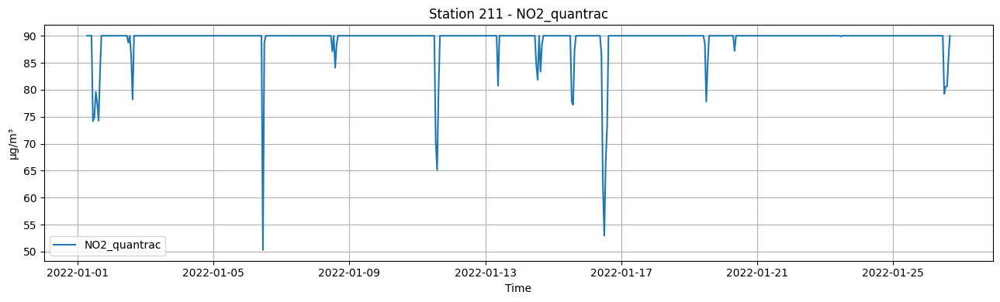

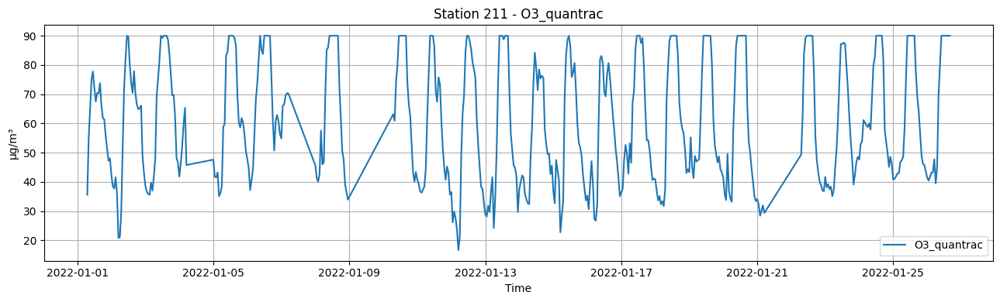

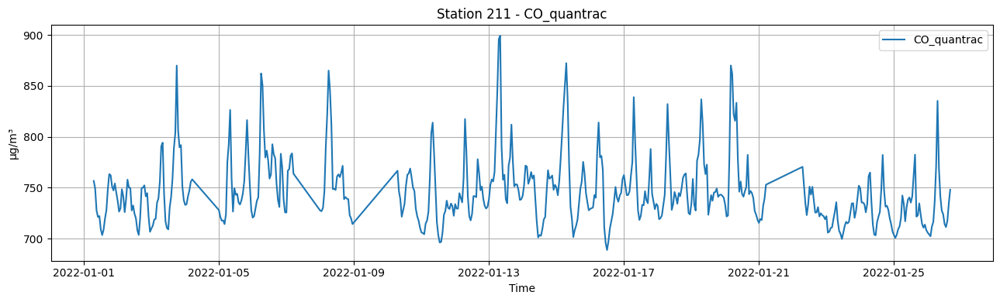

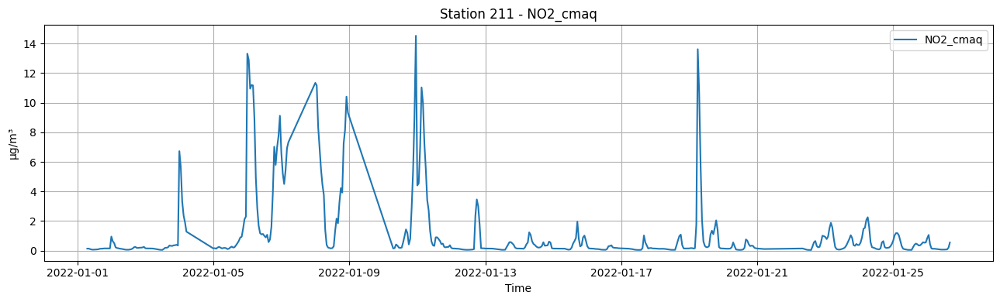

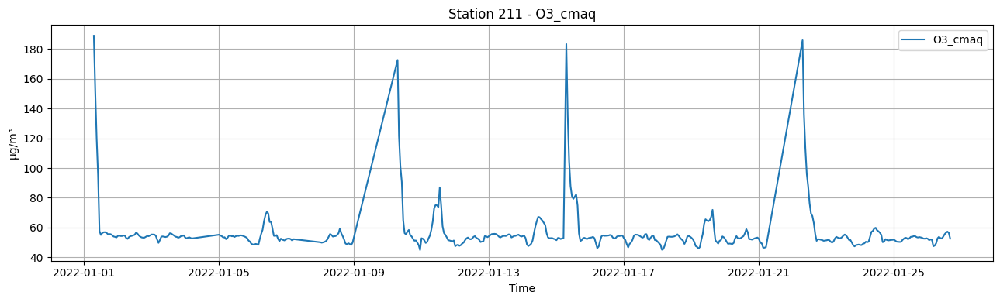

...

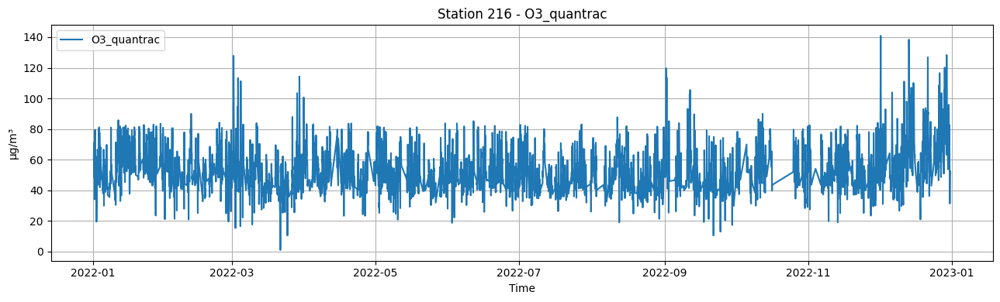

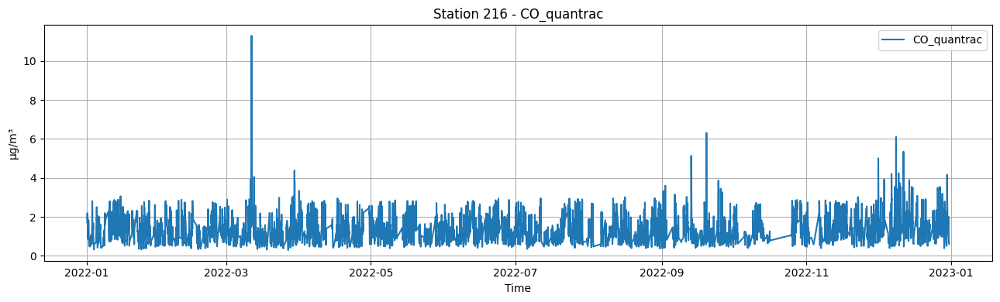

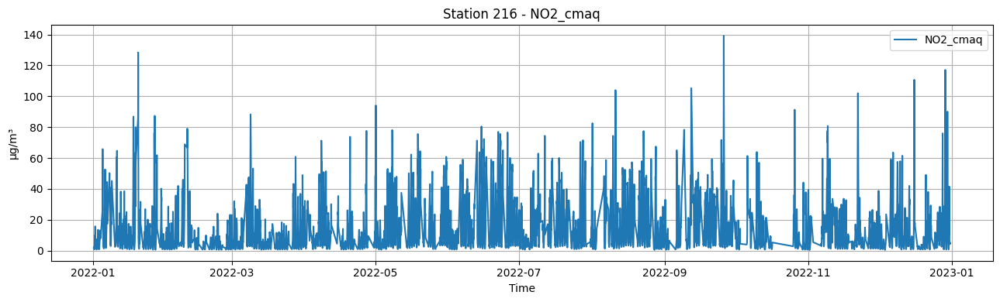

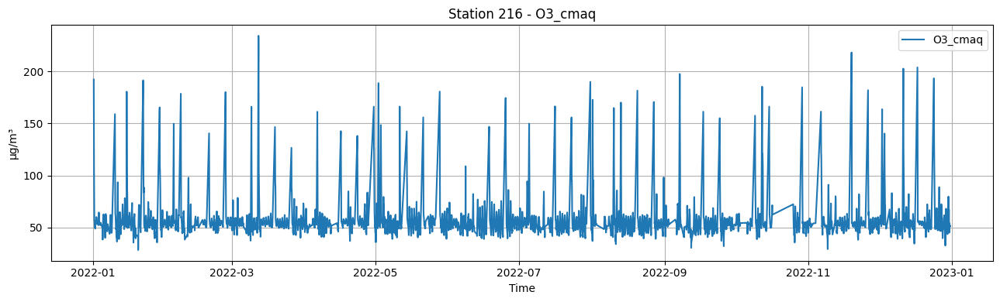

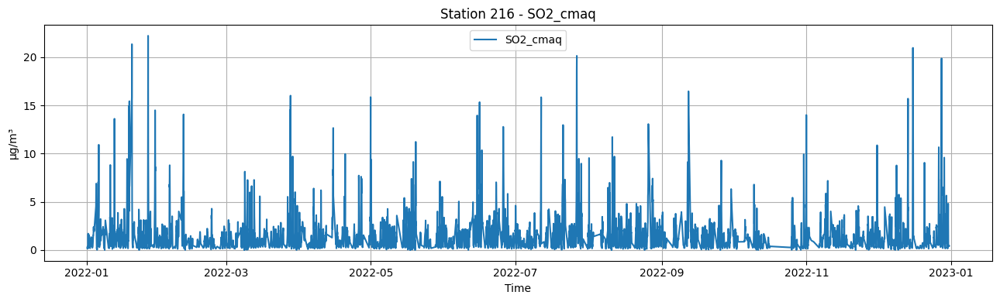

In [9]:
def plot_1_data(df, target_col, label, index, title, figsize=(13, 4)):
    plt.figure(figsize=figsize)
    plt.plot(index, df[target_col], label=label)
    plt.title(title)
    plt.xlabel("Time")
    plt.ylabel("µg/m³")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

for station in STATION_IDS:
    df_station = df_dropped[df_dropped["station_id"] == station]
    for target_col in df_station.columns:
        if target_col not in ["date", "station_id", "Temperature_quantrac", "Humid_quantrac", "PM25_quantrac"]:
            plot_1_data(df_station, target_col, target_col, df_station["date"], f"Station {station} - {target_col}")
            #plot_1_data(df_station, target_col, target_col, df_station.index, f"Station {station} - {target_col}")
    print("\n" + "=" * 150 + "\n")

## Convert ppm to ug/m3

Apply only to station 216, year 2022 on NO2, CO columns

Output: df_converted

In [10]:
df_converted = copy.deepcopy(df_dropped)
mask = (df_converted["station_id"] == 216) & (df_converted["date"] >= "2022-01-01")
df_converted.loc[mask, "NO2_quantrac"] = df_converted.loc[mask, "NO2_quantrac"].apply(lambda x: x * 1883.2)
df_converted.loc[mask, "CO_quantrac"] = df_converted.loc[mask, "CO_quantrac"].apply(lambda x: x * 1146.8)
df_converted

,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,NO2_cmaq,O3_cmaq,SO2_cmaq,station_id
0,2022-01-01 07:00:00,90.000000,22.783333,35.588975,756.627400,24.661667,73.355000,0.136344,188.993157,0.071526,211
1,2022-01-01 08:00:00,90.000000,21.883333,55.011077,749.102000,27.258333,65.521667,0.138604,151.741122,0.100084,211
2,2022-01-01 09:00:00,90.000000,16.233333,64.729197,727.519000,29.250000,57.910000,0.104141,119.571595,0.130476,211
3,2022-01-01 10:00:00,90.000000,15.700000,75.109218,721.196900,30.676667,53.673333,0.075893,95.109490,0.149078,211
4,2022-01-01 11:00:00,74.207348,15.650000,77.767804,722.056400,32.168333,49.080000,0.063087,57.721016,0.122092,211
...,...,...,...,...,...,...,...,...,...,...,...
8228,2022-12-31 01:00:00,92.346548,17.709259,31.425926,945.048148,26.659259,64.601852,4.285888,51.784937,0.389183,216
8229,2022-12-31 02:00:00,119.184217,22.803390,43.220339,822.974780,25.771186,66.067797,4.157322,51.295325,0.386550,216
8230,2022-12-31 03:00:00,130.034960,23.031667,48.866667,855.703933,25.178333,68.278333,4.235773,51.130547,0.394695,216
8231,2022-12-31 04:00:00,121.654720,22.331667,50.633333,708.340133,24.950000,68.225000,5.047855,51.640614,0.435544,216


## Visualization after converting unit

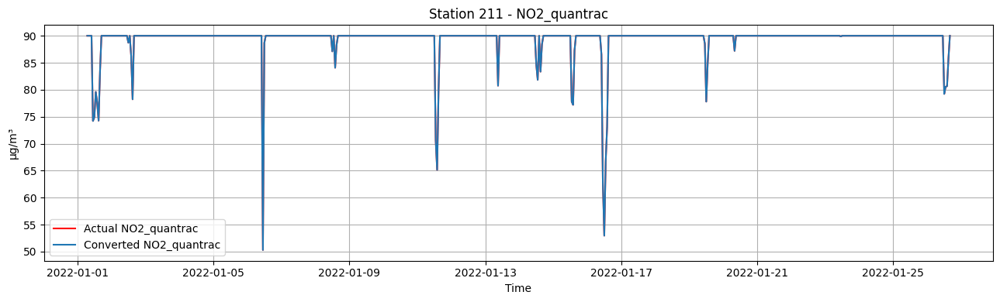

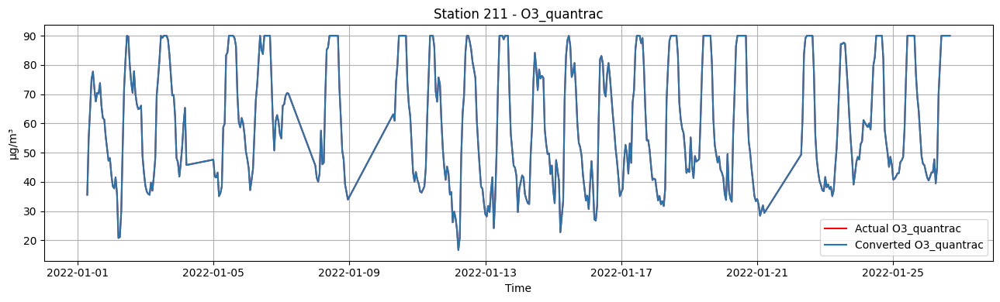

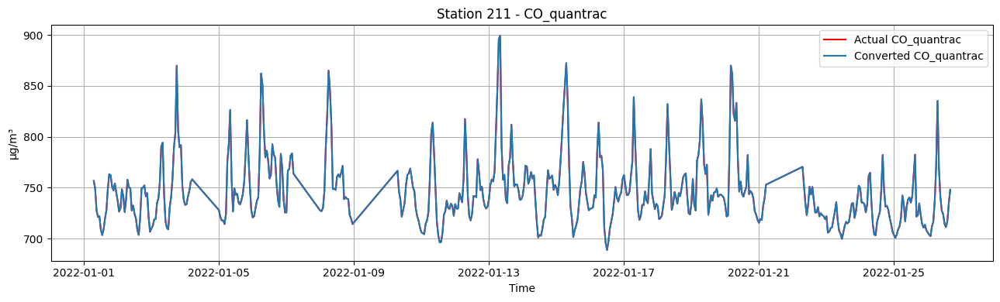

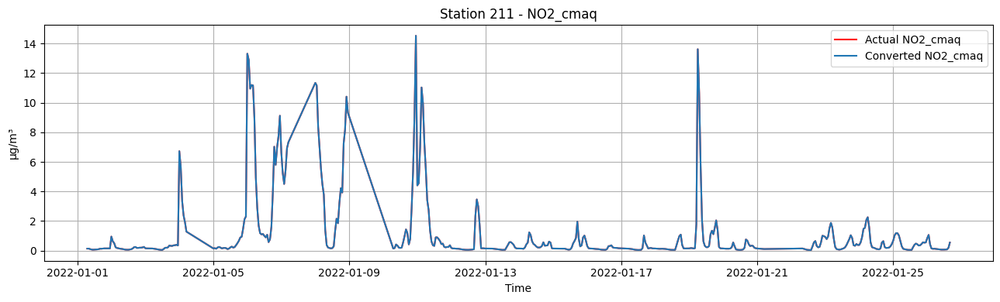

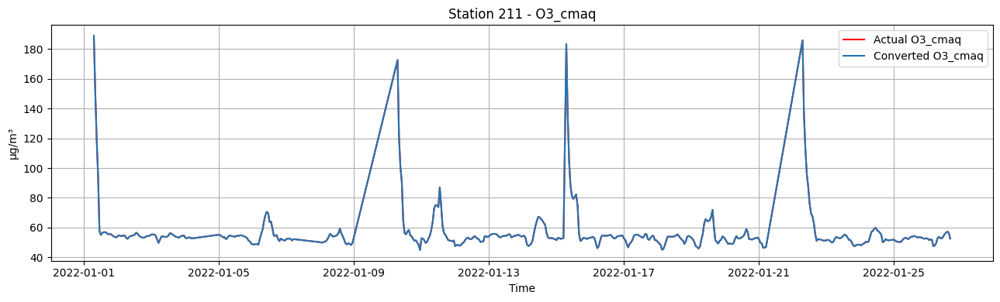

...

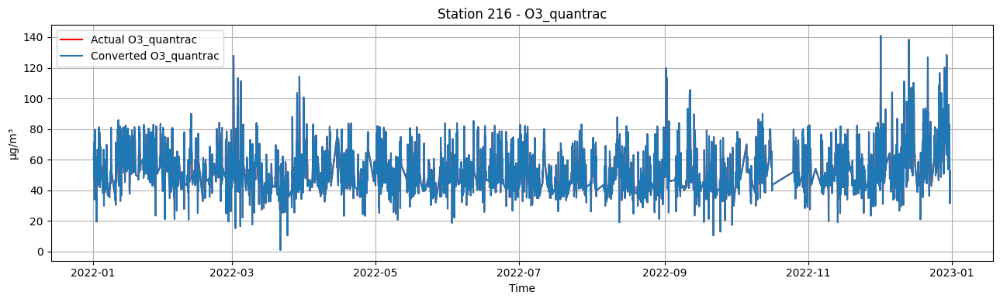

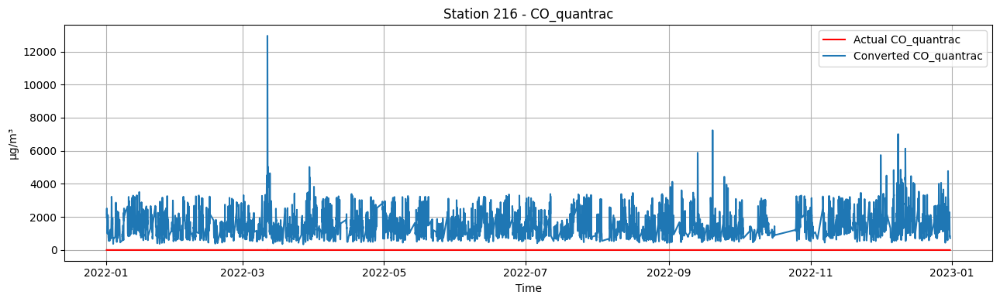

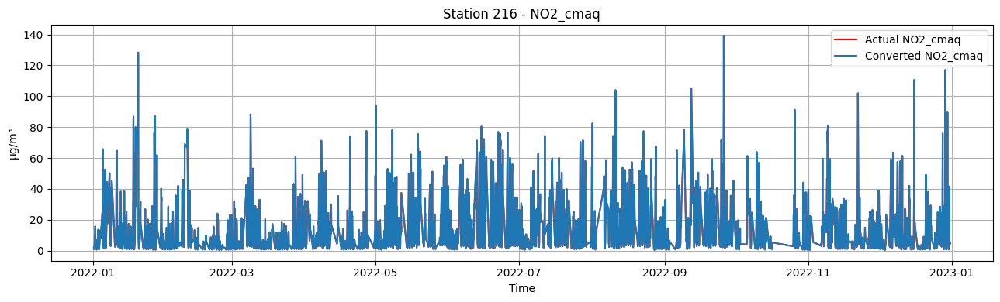

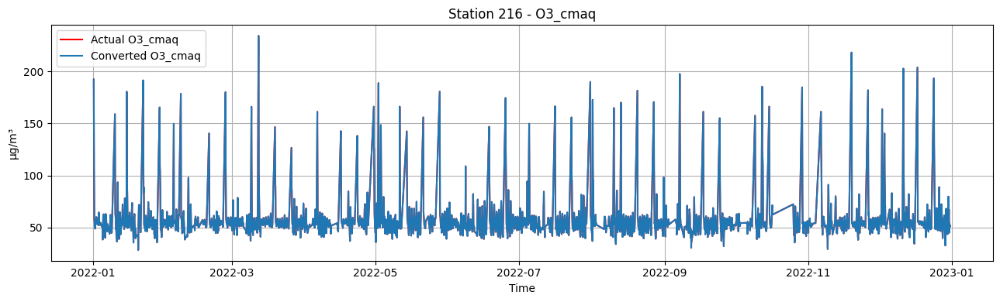

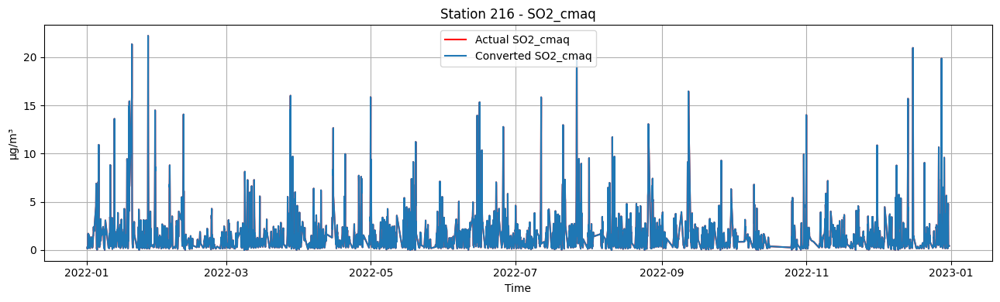

In [11]:
def plot_2_data(df1, target_col1, label1, df2, target_col2, label2, index, title, figsize=(13, 4)):
    plt.figure(figsize=figsize)
    plt.plot(index, df1[target_col1], label=label1, color="r")
    plt.plot(index, df2[target_col2], label=label2)
    plt.title(title)
    plt.xlabel("Time")
    plt.ylabel("µg/m³")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

for station in STATION_IDS:
    df_station = df_dropped[df_dropped["station_id"] == station]
    df_station_converted = df_converted[df_converted["station_id"] == station]
    for target_col in df_station.columns:
        if target_col not in ["date", "station_id", "Temperature_quantrac", "Humid_quantrac", "PM25_quantrac"]:
            plot_2_data(df_station, target_col, f"Actual {target_col}",
                        df_station_converted, target_col, f"Converted {target_col}",
                        df_station["date"], f"Station {station} - {target_col}")
                        #df_station.index, f"Station {station} - {target_col}")
    print("\n" + "=" * 150 + "\n")

## Ugly hack to remove outliers

In [12]:
test = copy.deepcopy(df_converted)

lenbefore = len(test)
print(f"Before: {lenbefore} records")

# 212 CO quantrac
test212 = test[test["station_id"] == 212]
test = test.drop(index=test212[test212["CO_quantrac"] > 4000].index)

# 213 CO quantrac
test213 = test[test["station_id"] == 213]
test = test.drop(index=test213[test213["CO_quantrac"] > 4000].index)

# 214 CO quantrac
test214 = test[test["station_id"] == 214]
test = test.drop(index=test214[test214["CO_quantrac"] > 4000].index)

# 215 NO2 quantrac
# 215 CO quantrac
test215 = test[test["station_id"] == 215]
test = test.drop(index=test215[test215["NO2_quantrac"] > 140].index)
test = test.drop(index=test215[test215["CO_quantrac"] > 2500].index)

# 216 CO quantrac
test216 = test[test["station_id"] == 216]
test = test.drop(index=test216[test216["CO_quantrac"] > 10000].index)

lenafter = len(test)
print(f"After: {lenafter} records")
print(f"Removed {lenbefore - lenafter} records")

df_converted = test.reset_index(drop=True)

Before: 8233 records
After: 8231 records
Removed 2 records


## Visualization after removing outliers

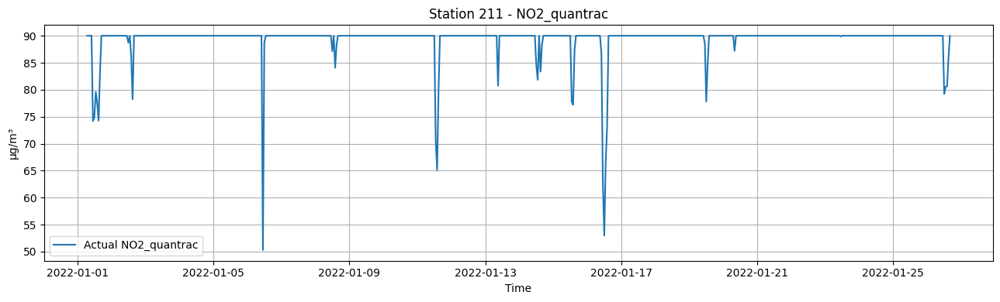

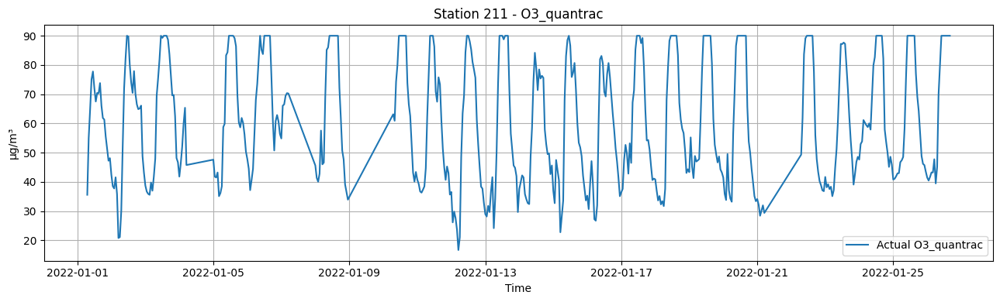

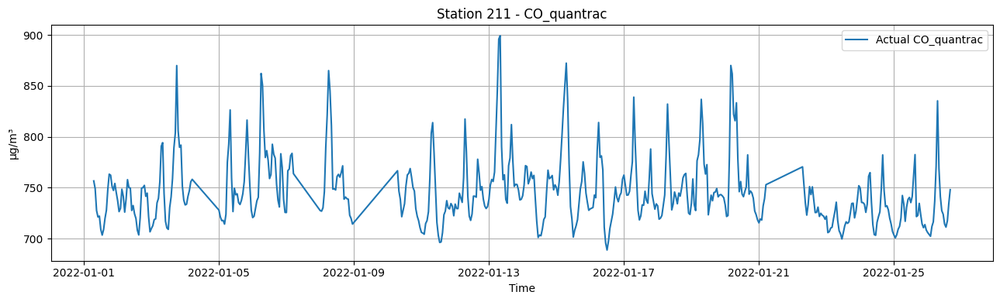

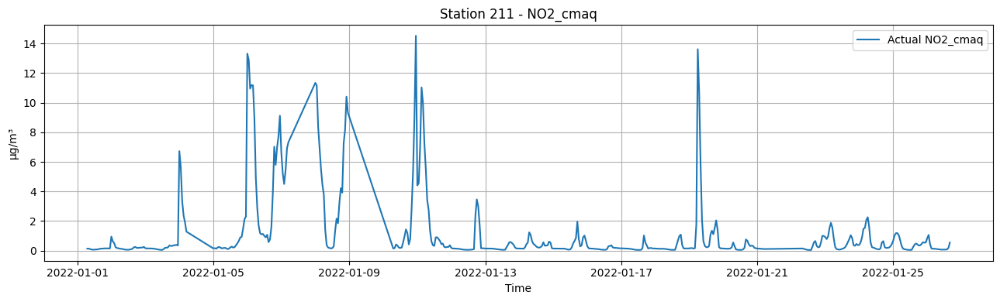

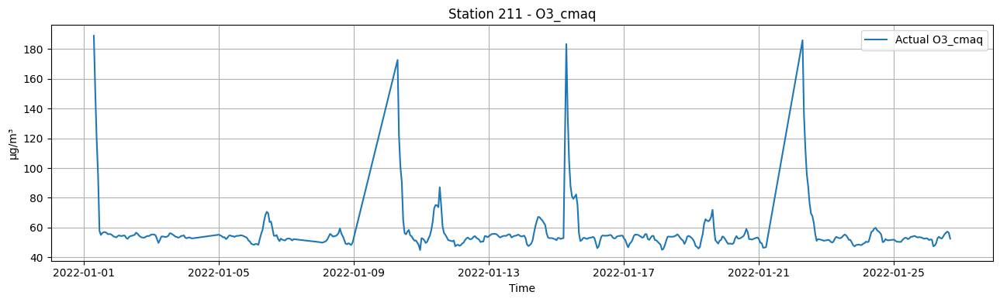

...

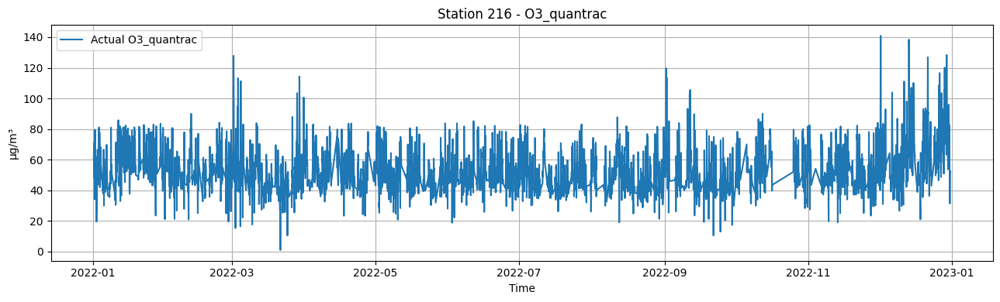

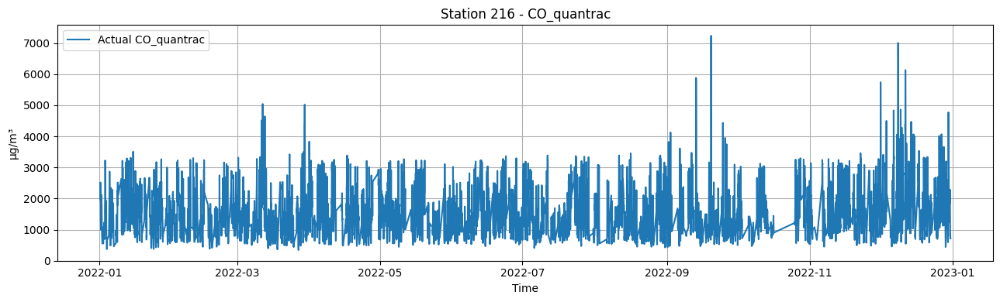

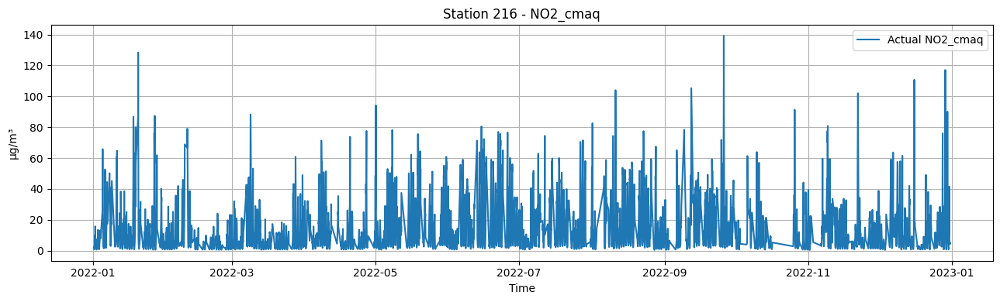

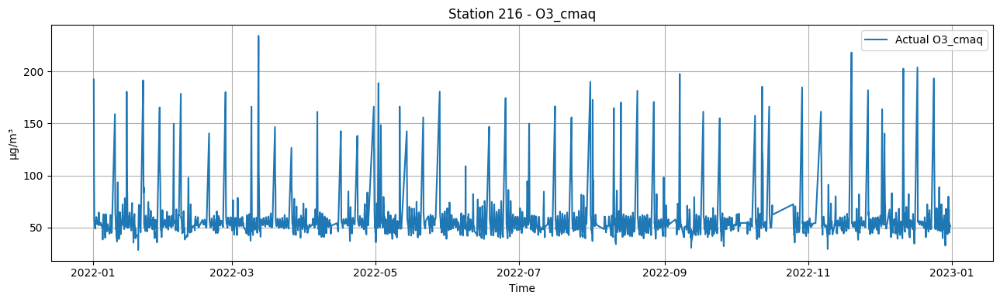

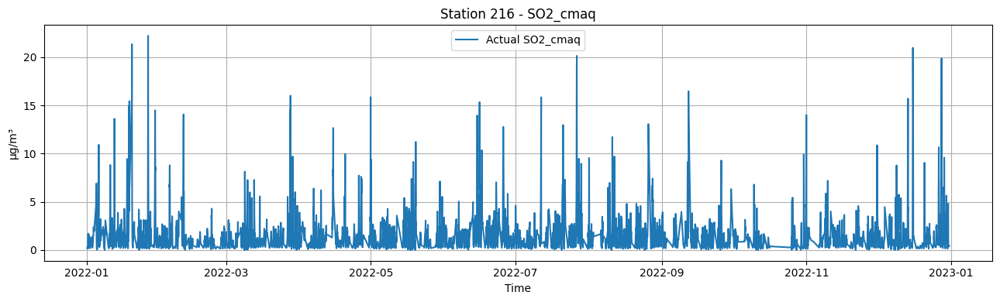

In [13]:
for station in STATION_IDS:
    df_station = df_converted[df_converted["station_id"] == station]
    for target_col in df_station.columns:
        if target_col not in ["date", "station_id", "Temperature_quantrac", "Humid_quantrac", "PM25_quantrac"]:
            plot_1_data(df_station, target_col, f"Actual {target_col}",
                        df_station["date"], f"Station {station} - {target_col}")
                        #df_station.index, f"Station {station} - {target_col}")
    print("\n" + "=" * 150 + "\n")

## Feature engineering

In [14]:
def add_time_features(df, time_col="date"):
    df = df.copy()
    df["hour"] = df[time_col].dt.hour
    df["dayofweek"] = df[time_col].dt.dayofweek
    df["month"] = df[time_col].dt.month
    return df

# Add lag features for all FEATURES including LABEL
def add_lag_features(df, group_col, target_cols, lag_steps):
    df = df.copy()
    df = df.sort_values(["station_id", "date"])

    for col in target_cols:
        for lag in lag_steps:
            df[f"{col}_lag{lag}"] = df.groupby(group_col)[col].shift(lag)
    return df

# Just add the rolling features for LABEL
def add_rolling_features(df, group_col, target_cols, windows):
    assert isinstance(target_cols, list), "target_cols should be a list"

    df = df.copy()
    df = df.sort_values(["station_id", "date"])

    for col in target_cols:
        for w in windows:
            df[f"{col}_roll{w}_mean"] = (
                df.groupby(group_col)[col]
                  .shift(1) # use the past, avoid leaking
                  .rolling(window=w, min_periods=1)
                  .mean()
                  .reset_index(level=0, drop=True)
            )
            df[f"{col}_roll{w}_std"] = (
                df.groupby(group_col)[col]
                  .shift(1)
                  .rolling(window=w, min_periods=1)
                  .std()
                  .reset_index(level=0, drop=True)
            )
    return df

# Add time features and lag feature for all gases
dftestno2 = add_time_features(df_converted)
dftestno2 = add_lag_features(df_converted, group_col="station_id", target_cols=BASE_FEATURE_COLS, lag_steps=[3, 6, 12, 24])
dftestno2 = add_rolling_features(df_converted, group_col="station_id", target_cols=["NO2_quantrac"], windows=[3, 6, 12, 24])
print(dftestno2.shape)
print(dftestno2.columns)
dftestno2

(8231, 19)
Index(['date', 'NO2_quantrac', 'PM25_quantrac', 'O3_quantrac', 'CO_quantrac',
       'Temperature_quantrac', 'Humid_quantrac', 'NO2_cmaq', 'O3_cmaq',
       'SO2_cmaq', 'station_id', 'NO2_quantrac_roll3_mean',
       'NO2_quantrac_roll3_std', 'NO2_quantrac_roll6_mean',
       'NO2_quantrac_roll6_std', 'NO2_quantrac_roll12_mean',
       'NO2_quantrac_roll12_std', 'NO2_quantrac_roll24_mean',
       'NO2_quantrac_roll24_std'],
      dtype='object')


,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,NO2_cmaq,O3_cmaq,SO2_cmaq,station_id,NO2_quantrac_roll3_mean,NO2_quantrac_roll3_std,NO2_quantrac_roll6_mean,NO2_quantrac_roll6_std,NO2_quantrac_roll12_mean,NO2_quantrac_roll12_std,NO2_quantrac_roll24_mean,NO2_quantrac_roll24_std
0,2022-01-01 07:00:00,90.000000,22.783333,35.588975,756.627400,24.661667,73.355000,0.136344,188.993157,0.071526,211,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2022-01-01 08:00:00,90.000000,21.883333,55.011077,749.102000,27.258333,65.521667,0.138604,151.741122,0.100084,211,90.000000,NaN,90.000000,NaN,90.000000,NaN,90.000000,NaN
2,2022-01-01 09:00:00,90.000000,16.233333,64.729197,727.519000,29.250000,57.910000,0.104141,119.571595,0.130476,211,90.000000,0.000000,90.000000,0.000000,90.000000,0.000000,90.000000,0.000000
3,2022-01-01 10:00:00,90.000000,15.700000,75.109218,721.196900,30.676667,53.673333,0.075893,95.109490,0.149078,211,90.000000,0.000000,90.000000,0.000000,90.000000,0.000000,90.000000,0.000000
4,2022-01-01 11:00:00,74.207348,15.650000,77.767804,722.056400,32.168333,49.080000,0.063087,57.721016,0.122092,211,90.000000,0.000000,90.000000,0.000000,90.000000,0.000000,90.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8226,2022-12-31 01:00:00,92.346548,17.709259,31.425926,945.048148,26.659259,64.601852,4.285888,51.784937,0.389183,216,162.467849,16.160517,167.076458,11.438594,151.443282,20.588002,157.199778,20.786118
8227,2022-12-31 02:00:00,119.184217,22.803390,43.220339,822.974780,25.771186,66.067797,4.157322,51.295325,0.386550,216,136.126298,40.487158,154.120158,32.318802,149.118635,25.435481,154.467975,24.639817
8228,2022-12-31 03:00:00,130.034960,23.031667,48.866667,855.703933,25.178333,68.278333,4.235773,51.130547,0.394695,216,118.448157,25.741473,145.145079,33.472296,146.514295,26.848976,153.499776,25.572650
8229,2022-12-31 04:00:00,121.654720,22.331667,50.633333,708.340133,24.950000,68.225000,5.047855,51.640614,0.435544,216,113.855242,19.401097,138.161545,31.048054,145.117588,27.265733,152.945279,25.944042


## Build supervised from time-series

In [15]:
# Reframe past future
def build_supervised_for_horizon(df, horizon_h, target_col):
    # Sort data by station_id then date
    df = df.copy()
    df = df.sort_values(["station_id", "date"])

    # Define target_name, which is the target_col plus horizon_h hour
    target_name = f"{target_col}_t_plus_{horizon_h}h"
    df[target_name] = df.groupby("station_id")[target_col].shift(-horizon_h)

    # Dropna after shifting
    df = df.dropna().reset_index(drop=True)

    # Define label, feature and meta columns
    label_cols = [target_name]
    meta_cols = ["date", "station_id"]
    feature_cols = [c for c in df.columns if c not in label_cols + meta_cols + [target_col]]

    # Get the X, y and meta data
    X = df[meta_cols + feature_cols]
    y = df[meta_cols + label_cols]

    return X, y

# Example
Xdummy, ydummy = build_supervised_for_horizon(dftestno2, horizon_h=72, target_col="NO2_quantrac")
print("Horizon 1h:", Xdummy.shape, ydummy.shape)
print(Xdummy.columns)
print(ydummy.columns)
display(Xdummy)
display(ydummy)

Horizon 1h: (7941, 18) (7941, 3)
Index(['date', 'station_id', 'PM25_quantrac', 'O3_quantrac', 'CO_quantrac',
       'Temperature_quantrac', 'Humid_quantrac', 'NO2_cmaq', 'O3_cmaq',
       'SO2_cmaq', 'NO2_quantrac_roll3_mean', 'NO2_quantrac_roll3_std',
       'NO2_quantrac_roll6_mean', 'NO2_quantrac_roll6_std',
       'NO2_quantrac_roll12_mean', 'NO2_quantrac_roll12_std',
       'NO2_quantrac_roll24_mean', 'NO2_quantrac_roll24_std'],
      dtype='object')
Index(['date', 'station_id', 'NO2_quantrac_t_plus_72h'], dtype='object')


,date,station_id,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,NO2_cmaq,O3_cmaq,SO2_cmaq,NO2_quantrac_roll3_mean,NO2_quantrac_roll3_std,NO2_quantrac_roll6_mean,NO2_quantrac_roll6_std,NO2_quantrac_roll12_mean,NO2_quantrac_roll12_std,NO2_quantrac_roll24_mean,NO2_quantrac_roll24_std
0,2022-01-01 09:00:00,211,16.233333,64.729197,727.519000,29.250000,57.910000,0.104141,119.571595,0.130476,90.000000,0.000000,90.000000,0.000000,90.000000,0.000000,90.000000,0.000000
1,2022-01-01 10:00:00,211,15.700000,75.109218,721.196900,30.676667,53.673333,0.075893,95.109490,0.149078,90.000000,0.000000,90.000000,0.000000,90.000000,0.000000,90.000000,0.000000
2,2022-01-01 11:00:00,211,15.650000,77.767804,722.056400,32.168333,49.080000,0.063087,57.721016,0.122092,90.000000,0.000000,90.000000,0.000000,90.000000,0.000000,90.000000,0.000000
3,2022-01-01 12:00:00,211,11.833333,72.086817,709.030200,31.860000,49.410000,0.068737,55.009452,0.085674,84.735783,9.117892,86.841470,7.062688,86.841470,7.062688,86.841470,7.062688
4,2022-01-01 13:00:00,211,7.900000,67.509674,703.414800,31.395000,50.456667,0.076458,56.294395,0.075980,79.699198,8.927288,84.849599,7.981889,84.849599,7.981889,84.849599,7.981889
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7936,2022-12-28 01:00:00,216,36.455000,71.900000,1250.967667,25.563333,78.383333,30.314140,41.167530,4.664907,168.263920,11.260467,168.033751,9.469346,151.461591,21.762316,161.247815,22.494585
7937,2022-12-28 02:00:00,216,53.257407,65.388889,2324.818444,25.151852,79.572222,6.613904,44.155574,0.802737,161.955200,3.029911,168.488858,9.010355,155.094598,19.205420,159.987117,21.515841
7938,2022-12-28 03:00:00,216,66.822034,66.677966,2334.612678,24.444068,82.755932,5.054940,47.539334,0.585151,168.090712,13.369010,171.436298,10.675101,160.659047,16.548023,159.738257,21.192842
7939,2022-12-28 04:00:00,216,67.953333,63.100000,2828.582200,23.873333,85.566667,4.827790,49.557571,0.524293,182.533012,20.234834,175.398466,16.600625,167.238277,16.053255,160.097983,21.856660


,date,station_id,NO2_quantrac_t_plus_72h
0,2022-01-01 09:00:00,211,90.000000
1,2022-01-01 10:00:00,211,90.000000
2,2022-01-01 11:00:00,211,90.000000
3,2022-01-01 12:00:00,211,90.000000
4,2022-01-01 13:00:00,211,90.000000
...,...,...,...
7936,2022-12-28 01:00:00,216,92.346548
7937,2022-12-28 02:00:00,216,119.184217
7938,2022-12-28 03:00:00,216,130.034960
7939,2022-12-28 04:00:00,216,121.654720


## Split train/validation/test for each station

In [16]:
def train_test_validation_split(X, y, train_ratio=0.7, val_ratio=0.15):
    assert (X["date"].equals(y["date"]) and X["station_id"].equals(y["station_id"])), "X and y should have the same metadata values"

    X_train, y_train, X_val, y_val, X_test, y_test = [], [], [], [], [], []
    meta_train, meta_val, meta_test = [], [], []

    meta_cols = ["date", "station_id"]
    
    for station in list(sorted(X["station_id"].unique())):
        X_station = X[X["station_id"] == station]
        y_station = y[y["station_id"] == station]
        meta = X_station[meta_cols]

        X_station = X_station.drop(columns=meta_cols)
        y_station = y_station.drop(columns=meta_cols)
    
        n = len(X_station)
        train_end = int(n * train_ratio)
        val_end = int(n * (train_ratio + val_ratio))
    
        X_train.append(X_station.iloc[:train_end])
        y_train.append(y_station.iloc[:train_end])
        meta_train.append(meta.iloc[:train_end])
    
        X_val.append(X_station.iloc[train_end:val_end])
        y_val.append(y_station.iloc[train_end:val_end])
        meta_val.append(meta.iloc[train_end:val_end])
    
        X_test.append(X_station.iloc[val_end:])
        y_test.append(y_station.iloc[val_end:])
        meta_test.append(meta.iloc[val_end:])

    X_train = pd.concat(X_train, axis=0)
    X_val = pd.concat(X_val, axis=0)
    X_test = pd.concat(X_test, axis=0)
    
    y_train = pd.concat(y_train, axis=0)
    y_val = pd.concat(y_val, axis=0)
    y_test = pd.concat(y_test, axis=0)
    
    meta_train = pd.concat(meta_train, axis=0)
    meta_val = pd.concat(meta_val, axis=0)
    meta_test = pd.concat(meta_test, axis=0)

    return (X_train, y_train, meta_train, X_val, y_val, meta_val, X_test, y_test, meta_test)

# Example
(X_train_dummy, y_train_dummy, meta_train_dummy,
 X_val_dummy, y_val_dummy, meta_val_dummy,
 X_test_dummy, y_test_dummy, meta_test_dummy) = train_test_validation_split(Xdummy, ydummy)
display(X_test_dummy)

,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,NO2_cmaq,O3_cmaq,SO2_cmaq,NO2_quantrac_roll3_mean,NO2_quantrac_roll3_std,NO2_quantrac_roll6_mean,NO2_quantrac_roll6_std,NO2_quantrac_roll12_mean,NO2_quantrac_roll12_std,NO2_quantrac_roll24_mean,NO2_quantrac_roll24_std
376,21.450000,48.707615,743.181000,26.031667,79.110000,0.241313,51.577298,0.200954,90.000000,0.000000,90.000000,0.000000,88.432086,3.670150,89.216043,2.661482
377,19.966667,44.278621,741.939500,25.538333,82.376667,0.155741,54.025587,0.166370,90.000000,0.000000,90.000000,0.000000,88.432086,3.670150,89.216043,2.661482
378,23.800000,43.220131,740.048600,24.866667,85.723333,0.151974,53.418367,0.165322,90.000000,0.000000,90.000000,0.000000,88.432086,3.670150,89.216043,2.661482
379,24.216667,41.524122,733.153500,24.635000,86.016667,0.147643,52.144722,0.170038,90.000000,0.000000,90.000000,0.000000,88.553533,3.698147,89.216043,2.661482
380,22.250000,35.910420,721.674400,24.271667,84.961667,0.139168,50.516562,0.178160,90.000000,0.000000,90.000000,0.000000,89.570823,1.486712,89.216043,2.661482
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7936,36.455000,71.900000,1250.967667,25.563333,78.383333,30.314140,41.167530,4.664907,168.263920,11.260467,168.033751,9.469346,151.461591,21.762316,161.247815,22.494585
7937,53.257407,65.388889,2324.818444,25.151852,79.572222,6.613904,44.155574,0.802737,161.955200,3.029911,168.488858,9.010355,155.094598,19.205420,159.987117,21.515841
7938,66.822034,66.677966,2334.612678,24.444068,82.755932,5.054940,47.539334,0.585151,168.090712,13.369010,171.436298,10.675101,160.659047,16.548023,159.738257,21.192842
7939,67.953333,63.100000,2828.582200,23.873333,85.566667,4.827790,49.557571,0.524293,182.533012,20.234834,175.398466,16.600625,167.238277,16.053255,160.097983,21.856660


## Apply IQR on test set only

In [17]:
# Return the index of outliers, using IQR
# This function will filter for each station
# Assuming that the index is applied for all stations
def get_outliers_indices(df, meta, target_col):
    combined_df = pd.concat((meta, df), axis=1)
    invalid_indices = []
    for station in combined_df["station_id"].unique():
        print(f"Station: {station}")
        df_station = combined_df[combined_df["station_id"] == station]

        Q3 = np.quantile(df_station[target_col], 0.75)
        Q1 = np.quantile(df_station[target_col], 0.25)
        IQR = Q3 - Q1
        print(f"IQR value for column {target_col} is: {IQR}")
    
        lower_range = Q1 - 1.5 * IQR
        upper_range = Q3 + 1.5 * IQR
        print(f"lower_range = {lower_range}, upper_range = {upper_range}")

        invalid_records = df_station[(df_station[target_col] < lower_range) | (df_station[target_col] > upper_range)]
        invalid_indices += list(invalid_records.index)
    return list(invalid_indices)

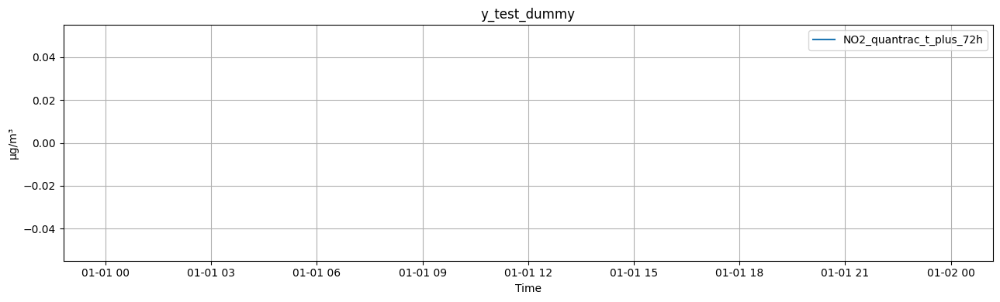

Station: 211
IQR value for column NO2_quantrac_t_plus_72h is: 0.0
lower_range = 90.0, upper_range = 90.0
Station: 212
IQR value for column NO2_quantrac_t_plus_72h is: 34.2514364493862
lower_range = 1.5550588765345097, upper_range = 138.5608046740793
Station: 213
IQR value for column NO2_quantrac_t_plus_72h is: 29.390566670000005
lower_range = 5.1754999949999885, upper_range = 122.73776667500002
Station: 216
IQR value for column NO2_quantrac_t_plus_72h is: 35.388053684210576
lower_range = 71.93142578947352, upper_range = 213.4836405263158
removed_indices = [438, 439, 440, 441, 6958, 6982, 7032, 7054, 7197, 7245, 7246, 7269, 7293, 7294, 7340, 7341, 7342, 7343, 7358, 7359, 7360, 7361, 7376, 7380, 7391, 7454, 7455, 7456, 7458, 7459, 7477, 7478, 7500, 7501, 7518, 7541, 7542, 7543, 7544, 7564, 7565, 7566, 7567, 7620, 7659, 7660, 7661, 7662, 7684, 7685, 7686, 7687, 7709, 7710, 7733, 7734, 7758, 7782, 7804, 7805, 7828, 7875, 7876, 7878, 7883, 7901, 7902]


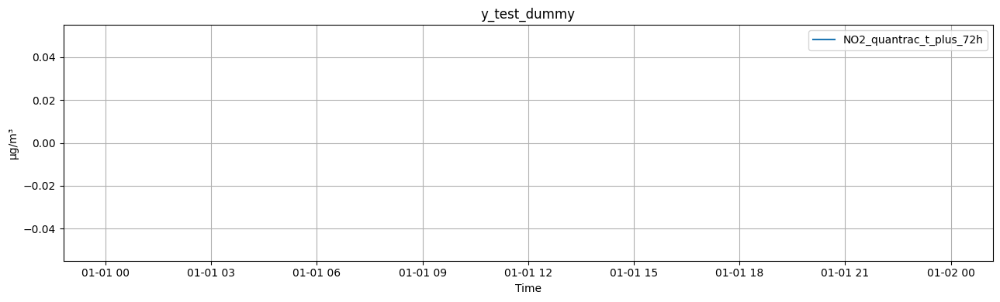

In [18]:
meta215 = meta_test_dummy[meta_test_dummy["station_id"] == 215]
test215 = y_test_dummy.loc[meta215.index]
plot_1_data(test215, "NO2_quantrac_t_plus_72h", "NO2_quantrac_t_plus_72h", meta215["date"], "y_test_dummy")

removed_indices = get_outliers_indices(y_test_dummy, meta_test_dummy, "NO2_quantrac_t_plus_72h")
print(f"removed_indices = {removed_indices}")

y_test_dummy_removed = y_test_dummy.drop(index=removed_indices)
X_test_dummy_removed = X_test_dummy.drop(index=removed_indices)
meta_test_dummy_removed = meta_test_dummy.drop(index=removed_indices)

meta215_removed = meta_test_dummy_removed[meta_test_dummy_removed["station_id"] == 215]
test215_removed = y_test_dummy_removed.loc[meta215_removed.index]
plot_1_data(test215_removed, "NO2_quantrac_t_plus_72h", "NO2_quantrac_t_plus_72h", meta215_removed["date"], "y_test_dummy")
#plot_1_data(test215_removed, "NO2_quantrac_t_plus_72h", "NO2_quantrac_t_plus_72h", test215_removed.index, "y_test_dummy")

## Metrics

In [19]:
def compute_metrics(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)

    # Mean Bias Error
    mbe = np.mean(y_pred - y_true)

    # MNBE
    yt_nonzero = np.where(y_true == 0, np.nan, y_true)
    mnbe = np.nanmean((y_pred - yt_nonzero) / yt_nonzero) * 100.0

    # Pearson r (with standard deviation check)
    if np.std(y_true) < 1e-6 or np.std(y_pred) < 1e-6:
        r = np.nan
    else:
        r = np.corrcoef(y_true.T, y_pred.T)[0, 1]

    return {
        "RMSE": rmse,
        "MAE": mae,
        "MBE": mbe,
        "MNBE": mnbe,
        "r": r,
        "n_samples": len(y_true),
    }

# LightGBM model

## Define model

In [20]:
def train_lgbm_for_horizon(df_feat,
                           horizon_h,
                           target_col,
                           learning_rate=0.05,
                           n_estimators=2000,
                           early_stopping_rounds=100):

    # Build supervised dataset
    X, y = build_supervised_for_horizon(df_feat, horizon_h=horizon_h, target_col=target_col)

    # Split train validation test
    (X_train, y_train, meta_train, X_val, y_val, meta_val, X_test, y_test, meta_test) = train_test_validation_split(X, y)

    # Remove outliers for test data
    #removed_indices = get_outliers_indices(y_test, meta_test, f"{target_col}_t_plus_{horizon_h}h")
    #print(f"Removed indices: {removed_indices}")
    #X_test = X_test.drop(index=removed_indices)
    #y_test = y_test.drop(index=removed_indices)
    #meta_test = meta_test.drop(index=removed_indices)

    # Dataset cho LightGBM
    lgb_train = lgb.Dataset(X_train, label=y_train)
    lgb_val = lgb.Dataset(X_val, label=y_val, reference=lgb_train)

    params = {
        "objective": "regression",
        "metric": "rmse",
        "learning_rate": learning_rate,
        "num_leaves": 63,
        "feature_fraction": 0.9,
        "bagging_fraction": 0.8,
        "bagging_freq": 1,
        "verbosity": -1,
        "device": "cuda",
        "seed": RANDOM_STATE,
    }

    # Early stopping dùng callback (tương thích nhiều version LightGBM)
    callbacks = [
        lgb.early_stopping(stopping_rounds=early_stopping_rounds),
        lgb.log_evaluation(period=100),
    ]
    model = lgb.train(
        params,
        lgb_train,
        num_boost_round=n_estimators,
        valid_sets=[lgb_train, lgb_val],
        valid_names=["train", "val"],
        callbacks=callbacks,
    )

    # Prediction
    y_pred = np.expand_dims(model.predict(X_test, num_iteration=model.best_iteration), axis=-1)
    metrics_overall = compute_metrics(y_test, y_pred)

    # Metrics for each station
    df_test_res = meta_test.copy()
    df_test_res["y_true"] = y_test.values
    df_test_res["y_pred"] = y_pred

    rows = []
    for sid, grp in df_test_res.groupby("station_id"):
        m = compute_metrics(grp["y_true"], grp["y_pred"])
        rows.append({"station": int(sid), "horizon_h": horizon_h,**m})
    metrics_by_station = pd.DataFrame(rows)

    return model, metrics_overall, metrics_by_station, (
        X_train, y_train, X_val, y_val, X_test, y_test, meta_test
    )

## Reference

In [21]:
def plot_timeseries_example(df, model, horizon_h, station_id, target_col, n_points=300):
    # Prepare data for reference
    X, y = build_supervised_for_horizon(df, horizon_h, target_col)
    (_, _, _,
     _, _, _,
     X_test, y_test, meta_test) = train_test_validation_split(X, y)

    # Remove outliers for test data
    #removed_indices = get_outliers_indices(y_test, meta_test, f"{target_col}_t_plus_{horizon_h}h")
    #print(f"Removed indices: {removed_indices}")
    #X_test = X_test.drop(index=removed_indices)
    #y_test = y_test.drop(index=removed_indices)
    #meta_test = meta_test.drop(index=removed_indices)

    # Get the data of station
    mask = (meta_test["station_id"] == station_id)
    X_test_sid = X_test[mask]
    y_test_sid = y_test[mask]
    meta_sid = meta_test[mask]
    if len(X_test_sid) == 0:
        print(f"No test sample for station {station_id}")
        return
    
    # Prediction
    y_pred_sid = model.predict(X_test_sid, num_iteration=getattr(model, "best_iteration", None))

    # Plotting
    X_plot = meta_sid.iloc[-n_points:]
    y_true_plot = y_test_sid.iloc[-n_points:]
    y_pred_plot = y_pred_sid[-n_points:]

    plt.figure(figsize=(14, 5))
    #plt.plot(X_plot["date"], y_true_plot, label=f"Actual {target_col}", linewidth=1.5)
    #plt.plot(X_plot["date"], y_pred_plot, label=f"Predicted {target_col} (LightGBM)", linestyle="--")
    plt.plot(X_plot.index, y_true_plot, label=f"Actual {target_col}", linewidth=1.5)
    plt.plot(X_plot.index, y_pred_plot, label=f"Predicted {target_col} (LightGBM)", linestyle="--")
    plt.title(f"Station {station_id} - Horizon {horizon_h}h")
    plt.xlabel("Time")
    plt.ylabel(f"{target_col} (µg/m³)")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(os.path.join(LIGHTGBM_DIR, f"{target_col}_lightgbm_{horizon_h}h_{station_id}_{n_points}.png"))
    plt.show()

## Add time and lags features

In [22]:
# Add time features and lag feature for all gases
df_time_feats = add_time_features(df_converted)
df_lag_feats = add_lag_features(df_time_feats, group_col="station_id", target_cols=BASE_FEATURE_COLS, lag_steps=LAG_STEPS)

## Training for NO2

In [23]:
label = "NO2_quantrac"

# Add rolling features for LABEL
df_no2 = add_rolling_features(df_lag_feats, group_col="station_id", target_cols=[label], windows=ROLL_WINDOWS)

print(df_no2.columns)

# Start running model
no2_all_metrics = []
no2_models_by_h = {}
for h in HORIZONS:
    print(f"\n===== Training LightGBM for horizon = {h}h, target_col = {label} =====")
    model_h, metrics_overall, metrics_by_station, _ = train_lgbm_for_horizon(df_no2, horizon_h=h, target_col=label)
    no2_models_by_h[h] = model_h
    model_h.save_model(os.path.join(LIGHTGBM_DIR, f"{label}_lightgbm_{h}h"))
    print("Overall test metrics:", metrics_overall)
    no2_all_metrics.append(metrics_by_station)

# Metrics table
no2_df_metrics_all = pd.concat(no2_all_metrics, ignore_index=True)
no2_df_metrics_all = no2_df_metrics_all.sort_values(["station", "horizon_h"]).reset_index(drop=True)
no2_df_metrics_all.to_csv(os.path.join(LIGHTGBM_DIR, f"{label}_metrics.csv"))
no2_df_metrics_all

Index(['date', 'NO2_quantrac', 'PM25_quantrac', 'O3_quantrac', 'CO_quantrac',
       'Temperature_quantrac', 'Humid_quantrac', 'NO2_cmaq', 'O3_cmaq',
       'SO2_cmaq', 'station_id', 'hour', 'dayofweek', 'month',
       'NO2_quantrac_lag3', 'NO2_quantrac_lag6', 'NO2_quantrac_lag12',
       'NO2_quantrac_lag24', 'PM25_quantrac_lag3', 'PM25_quantrac_lag6',
       'PM25_quantrac_lag12', 'PM25_quantrac_lag24', 'O3_quantrac_lag3',
       'O3_quantrac_lag6', 'O3_quantrac_lag12', 'O3_quantrac_lag24',
       'CO_quantrac_lag3', 'CO_quantrac_lag6', 'CO_quantrac_lag12',
       'CO_quantrac_lag24', 'Temperature_quantrac_lag3',
       'Temperature_quantrac_lag6', 'Temperature_quantrac_lag12',
       'Temperature_quantrac_lag24', 'Humid_quantrac_lag3',
       'Humid_quantrac_lag6', 'Humid_quantrac_lag12', 'Humid_quantrac_lag24',
       'NO2_cmaq_lag3', 'NO2_cmaq_lag6', 'NO2_cmaq_lag12', 'NO2_cmaq_lag24',
       'O3_cmaq_lag3', 'O3_cmaq_lag6', 'O3_cmaq_lag12', 'O3_cmaq_lag24',
       'SO2_cmaq_lag3'

,station,horizon_h,RMSE,MAE,MBE,MNBE,r,n_samples
0,211,1,2.016077,1.190384,-0.581397,-0.638533,0.648697,74
1,211,24,2.359142,1.314817,1.228209,1.426496,0.193293,71
2,211,48,3.827347,3.155235,3.155235,3.588571,-0.020674,67
3,211,72,5.358107,4.925157,4.925157,5.568744,0.174487,64
4,212,1,15.566023,10.191195,3.348305,7.320319,0.681516,74
5,212,24,17.481547,12.038655,9.259632,18.081299,0.665987,71
6,212,48,19.714902,14.528457,12.287138,22.744760,0.621261,67
7,212,72,20.597084,15.453480,13.350083,23.588764,0.647205,64
8,213,1,15.168711,11.700342,1.221244,17.130954,0.781457,74
9,213,24,18.389753,13.836634,6.535313,44.586354,0.687616,71


station_id = 211
hour = 1


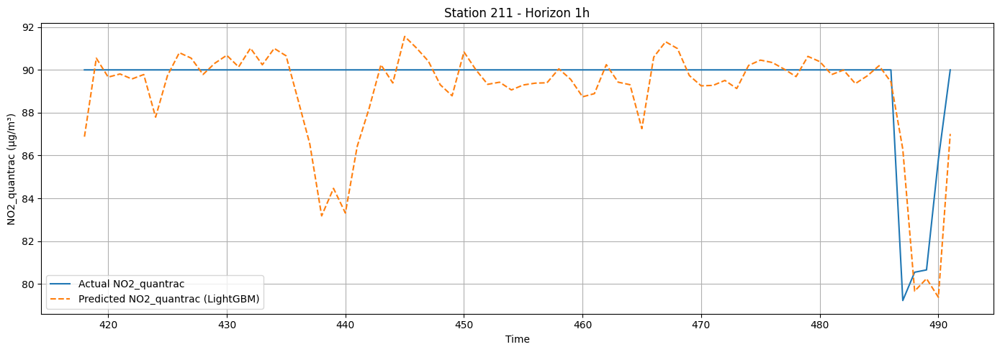

hour = 24


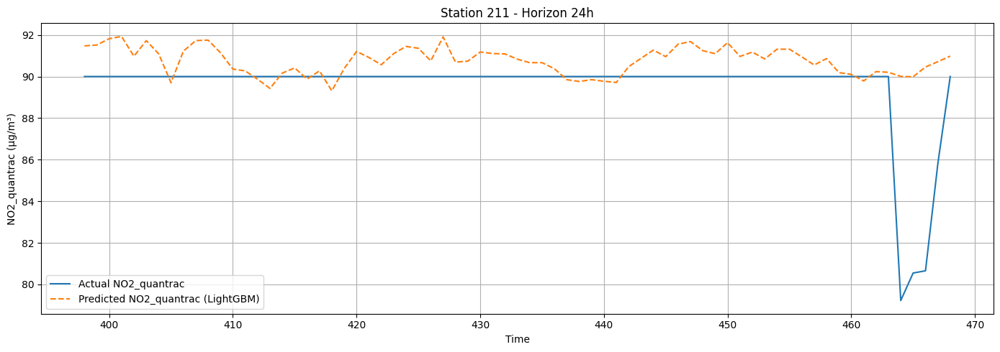

hour = 48


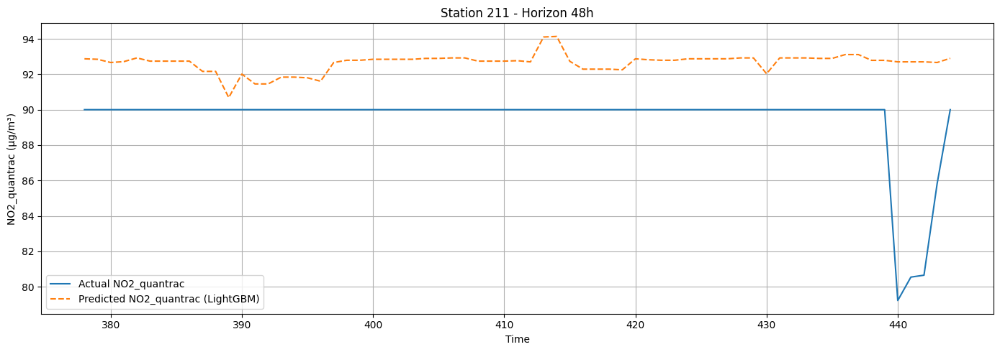

hour = 72


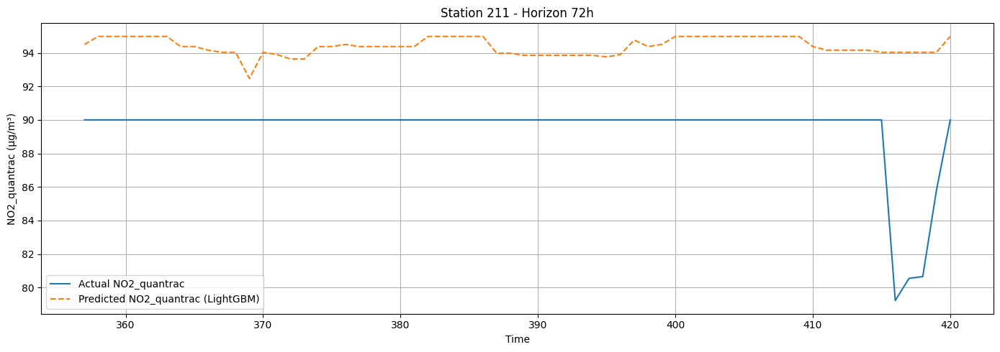

station_id = 212
hour = 1


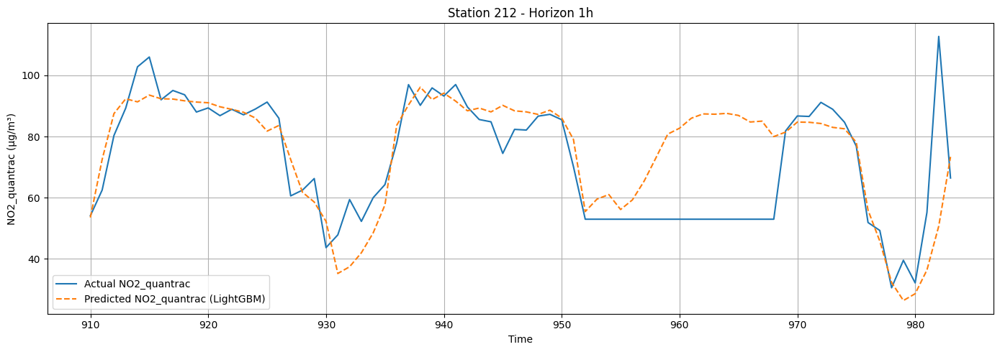

hour = 24


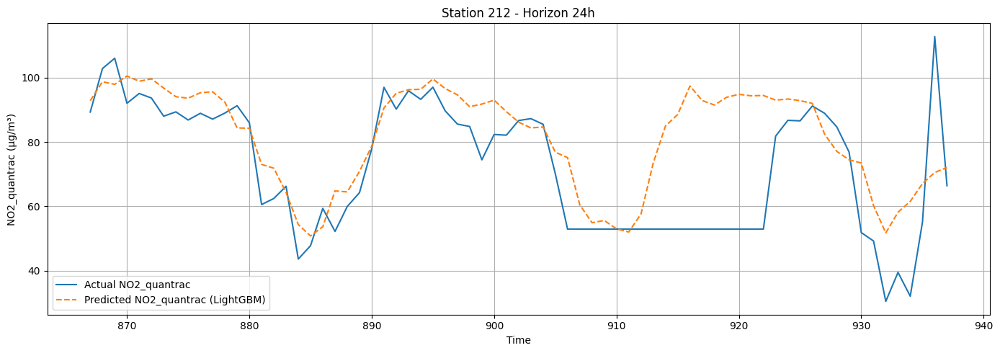

hour = 48


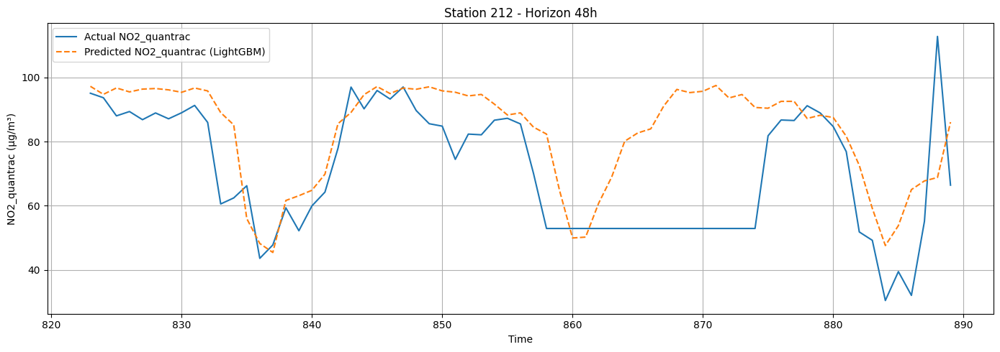

hour = 72


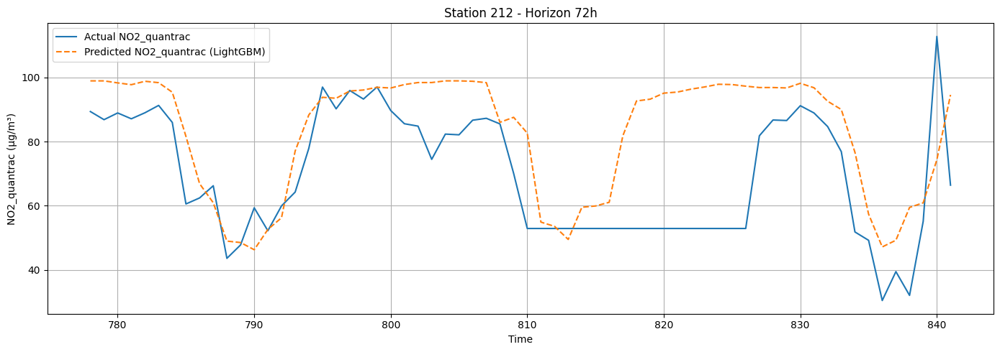

station_id = 213
hour = 1


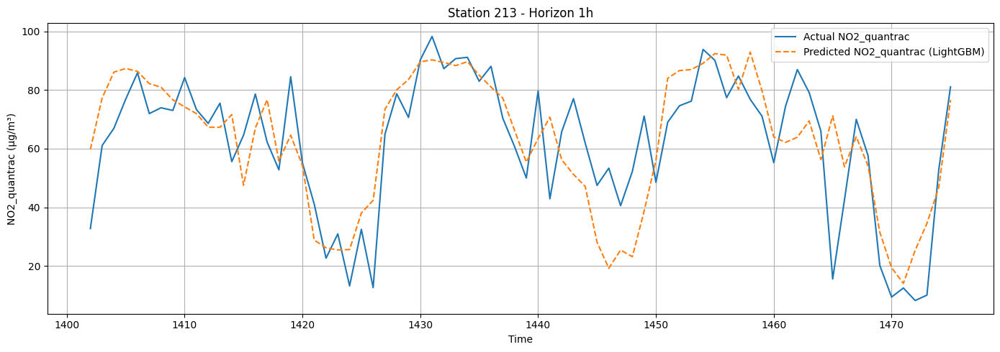

hour = 24


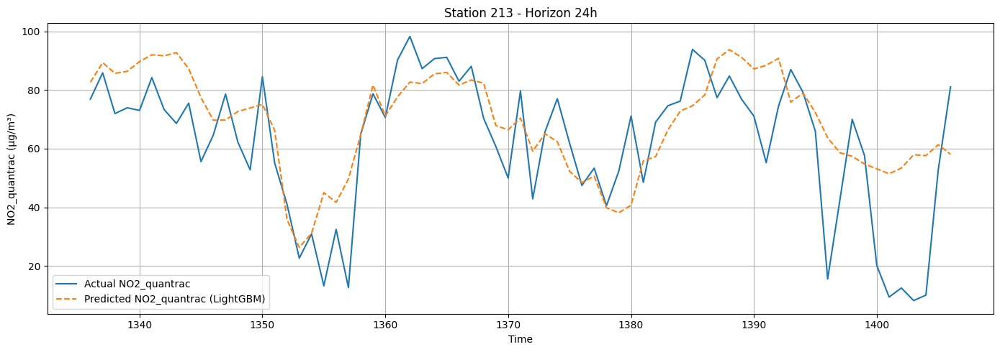

hour = 48


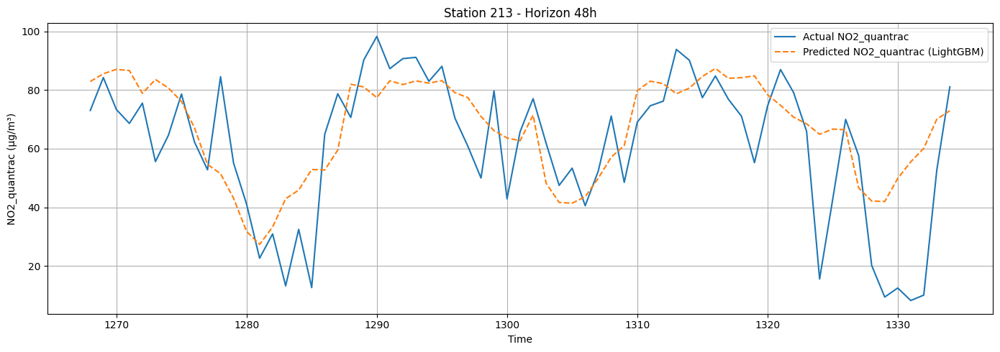

hour = 72


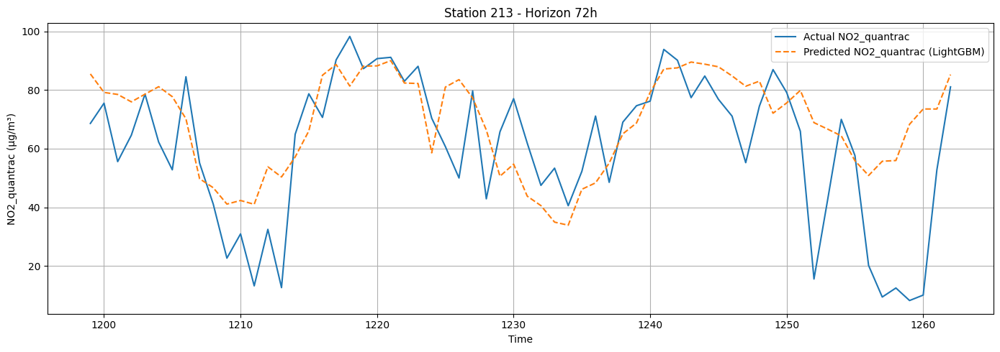

station_id = 216
hour = 1


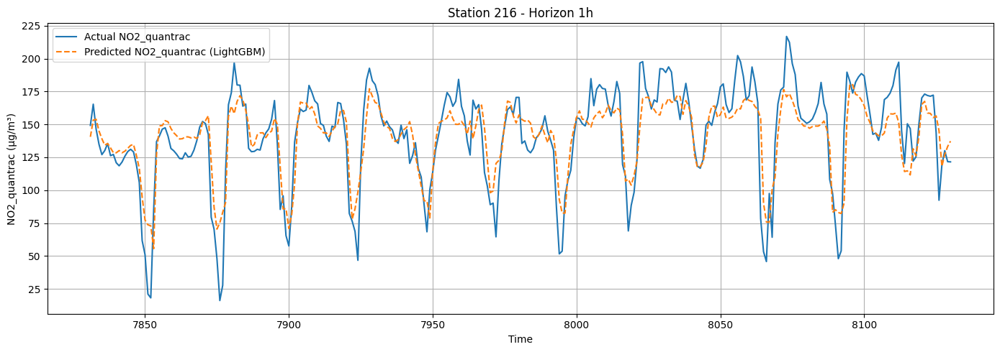

hour = 24


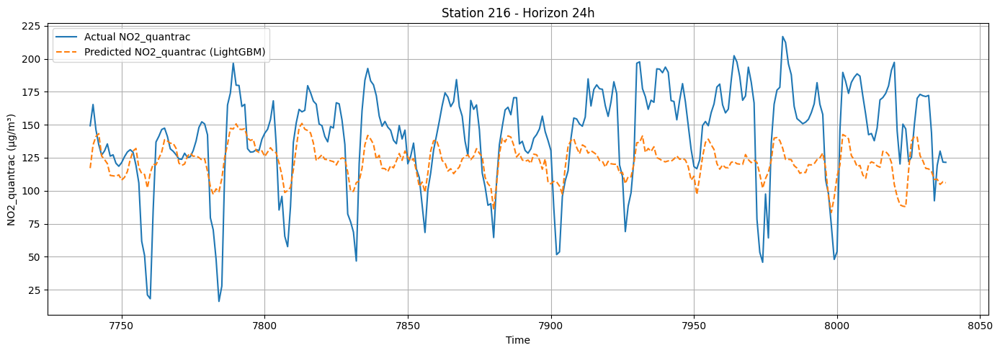

hour = 48


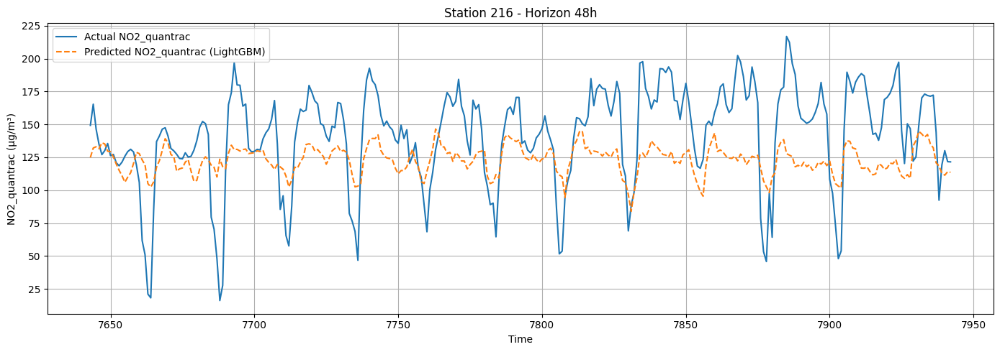

hour = 72


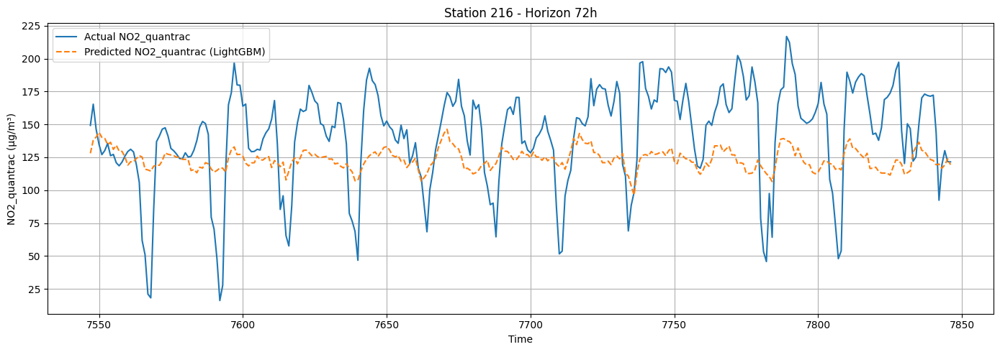

In [24]:
# Reference
for station_id in STATION_IDS:
    print(f"station_id = {station_id}")
    for hour in HORIZONS:
        print(f"hour = {hour}")
        plot_timeseries_example(df_no2, no2_models_by_h[hour], horizon_h=hour, station_id=station_id, target_col=label)

## Training for O3

In [25]:
label = "O3_quantrac"

# Add rolling features for LABEL
df_o3 = add_rolling_features(df_lag_feats, group_col="station_id", target_cols=[label], windows=ROLL_WINDOWS)
print(df_o3.columns)

# Start running model
o3_all_metrics = []
o3_models_by_h = {}
for h in HORIZONS:
    print(f"\n===== Training LightGBM for horizon = {h}h, target_col = {label} =====")
    model_h, metrics_overall, metrics_by_station, _ = train_lgbm_for_horizon(df_o3, horizon_h=h, target_col=label)
    o3_models_by_h[h] = model_h
    model_h.save_model(os.path.join(LIGHTGBM_DIR, f"{label}_lightgbm_{h}h"))
    print("Overall test metrics:", metrics_overall)
    o3_all_metrics.append(metrics_by_station)

o3_df_metrics_all = pd.concat(o3_all_metrics, ignore_index=True)
o3_df_metrics_all = o3_df_metrics_all.sort_values(["station", "horizon_h"])
o3_df_metrics_all.to_csv(os.path.join(LIGHTGBM_DIR, f"{label}_metrics.csv"))
o3_df_metrics_all

Index(['date', 'NO2_quantrac', 'PM25_quantrac', 'O3_quantrac', 'CO_quantrac',
       'Temperature_quantrac', 'Humid_quantrac', 'NO2_cmaq', 'O3_cmaq',
       'SO2_cmaq', 'station_id', 'hour', 'dayofweek', 'month',
       'NO2_quantrac_lag3', 'NO2_quantrac_lag6', 'NO2_quantrac_lag12',
       'NO2_quantrac_lag24', 'PM25_quantrac_lag3', 'PM25_quantrac_lag6',
       'PM25_quantrac_lag12', 'PM25_quantrac_lag24', 'O3_quantrac_lag3',
       'O3_quantrac_lag6', 'O3_quantrac_lag12', 'O3_quantrac_lag24',
       'CO_quantrac_lag3', 'CO_quantrac_lag6', 'CO_quantrac_lag12',
       'CO_quantrac_lag24', 'Temperature_quantrac_lag3',
       'Temperature_quantrac_lag6', 'Temperature_quantrac_lag12',
       'Temperature_quantrac_lag24', 'Humid_quantrac_lag3',
       'Humid_quantrac_lag6', 'Humid_quantrac_lag12', 'Humid_quantrac_lag24',
       'NO2_cmaq_lag3', 'NO2_cmaq_lag6', 'NO2_cmaq_lag12', 'NO2_cmaq_lag24',
       'O3_cmaq_lag3', 'O3_cmaq_lag6', 'O3_cmaq_lag12', 'O3_cmaq_lag24',
       'SO2_cmaq_lag3'

,station,horizon_h,RMSE,MAE,MBE,MNBE,r,n_samples
0,211,1,8.164479,5.784725,-3.236783,-4.352826,0.917254,74
4,211,24,9.749717,7.937053,-3.563083,-3.560135,0.881034,71
8,211,48,11.770447,9.047114,-6.544350,-7.782524,0.868774,67
12,211,72,10.074047,8.159676,-4.895906,-5.453433,0.895238,64
1,212,1,24.930209,20.465432,3.568833,7.396429,0.426435,74
5,212,24,28.122459,22.382789,13.138587,16.893663,0.390293,71
9,212,48,25.120963,19.963526,7.814511,11.715498,0.337989,67
13,212,72,27.275701,22.791528,11.365162,15.767405,0.260602,64
2,213,1,17.977305,13.571584,-1.231624,8.695476,0.738889,74
6,213,24,20.071641,15.697493,-2.657161,6.234537,0.662300,71


station_id = 211
hour = 1


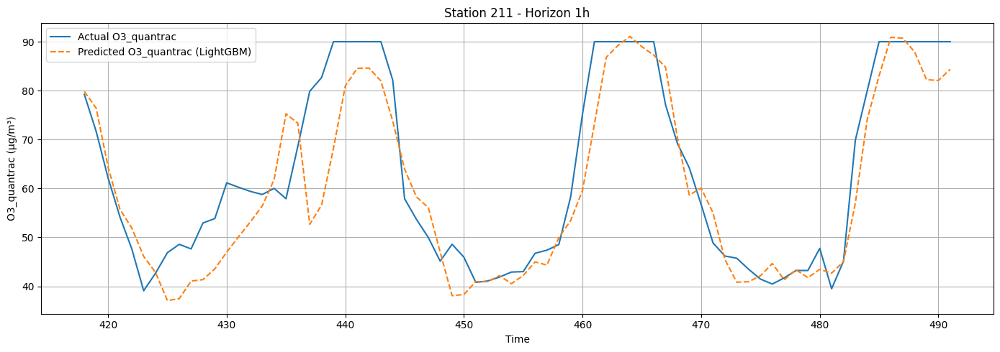

hour = 24


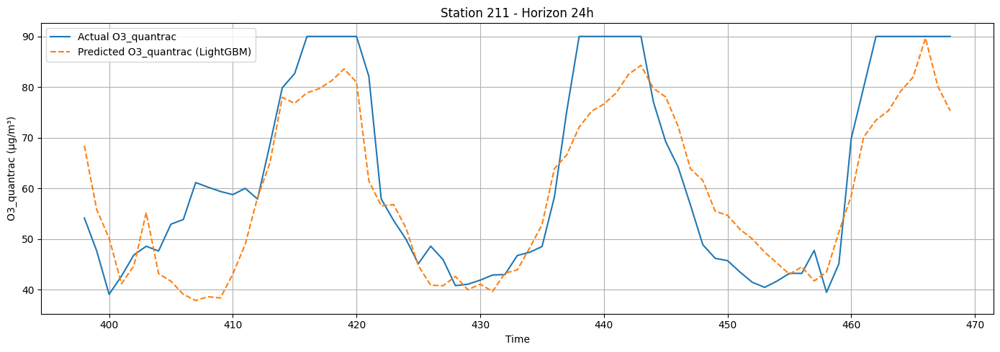

hour = 48


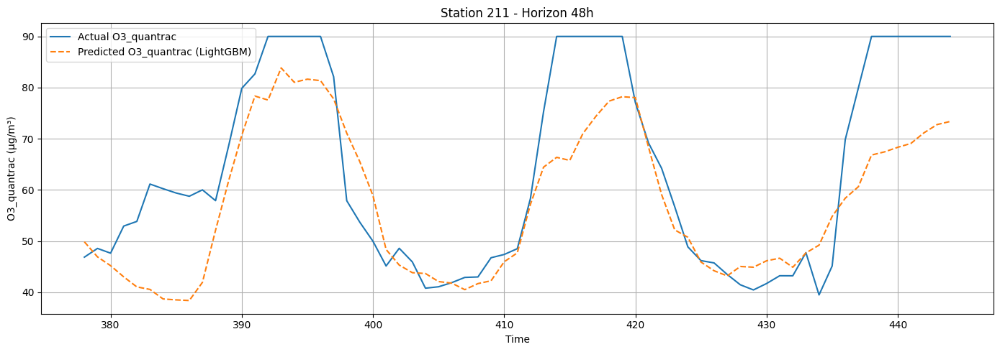

hour = 72


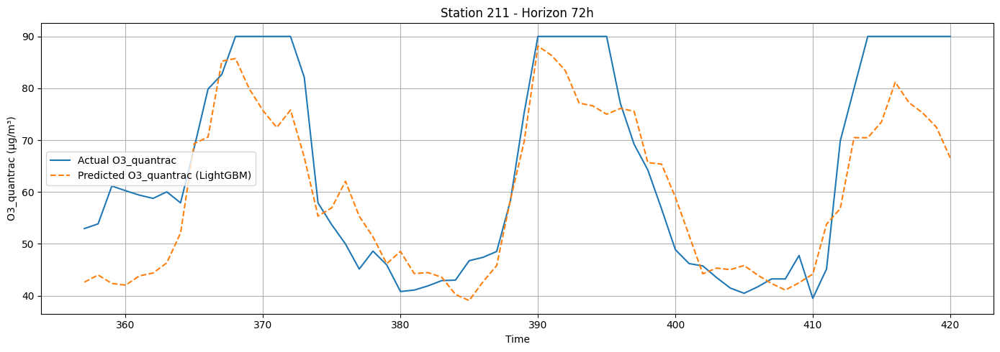

station_id = 212
hour = 1


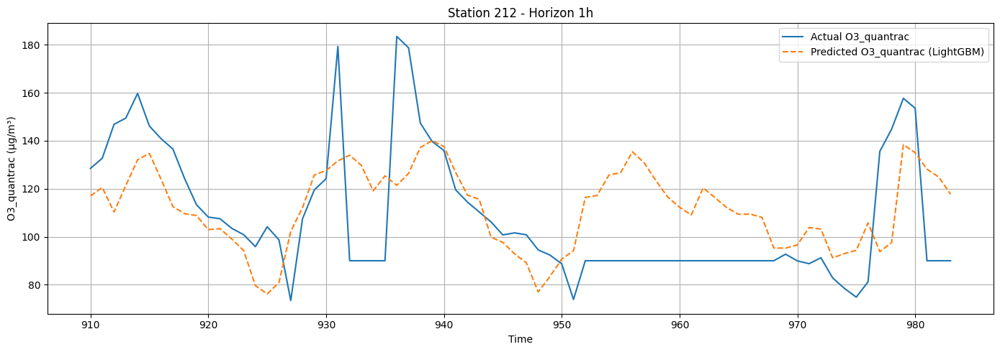

hour = 24


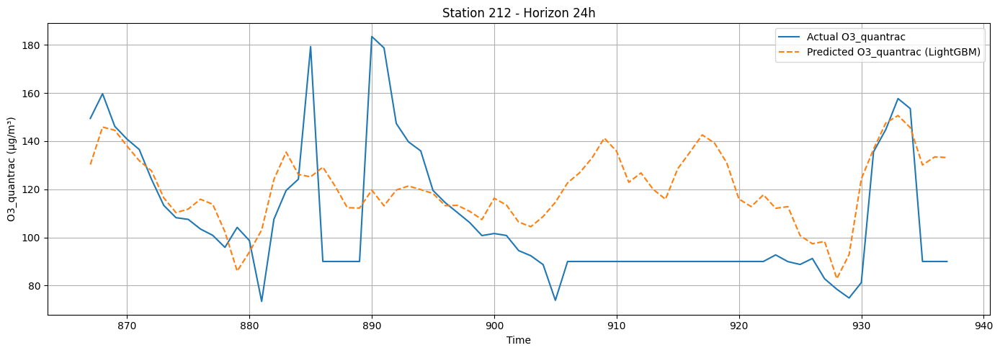

hour = 48


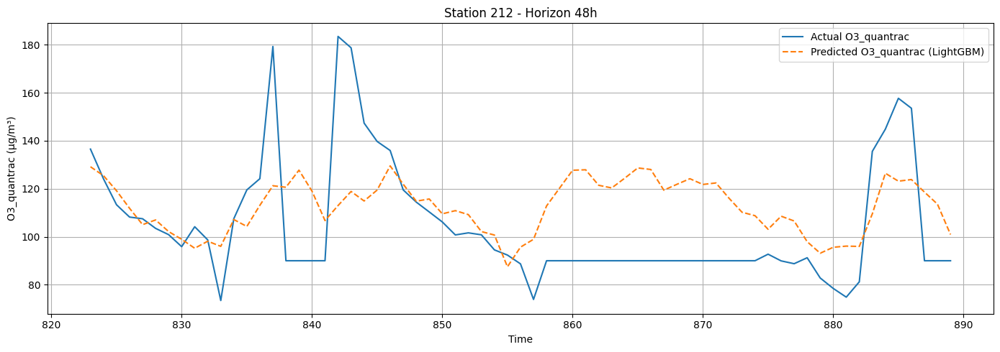

hour = 72


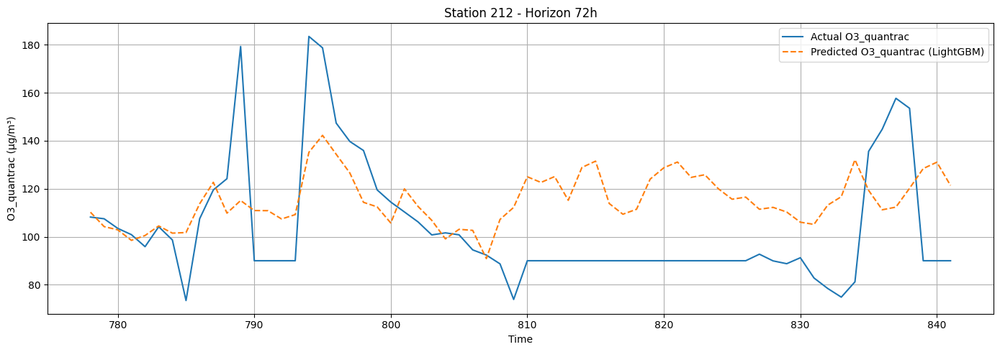

station_id = 213
hour = 1


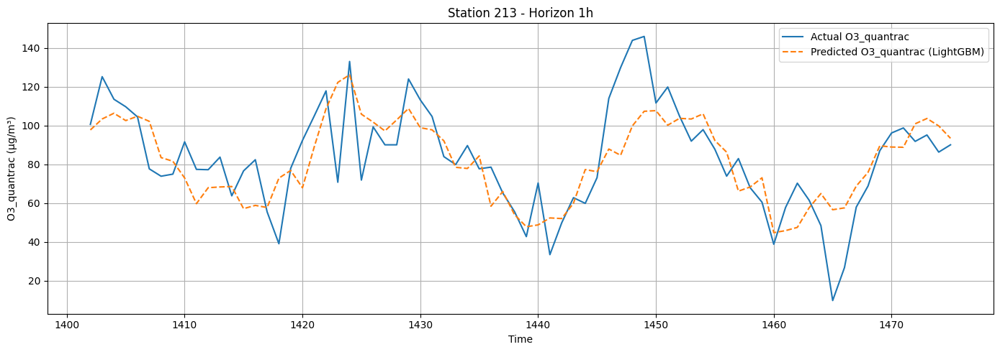

hour = 24


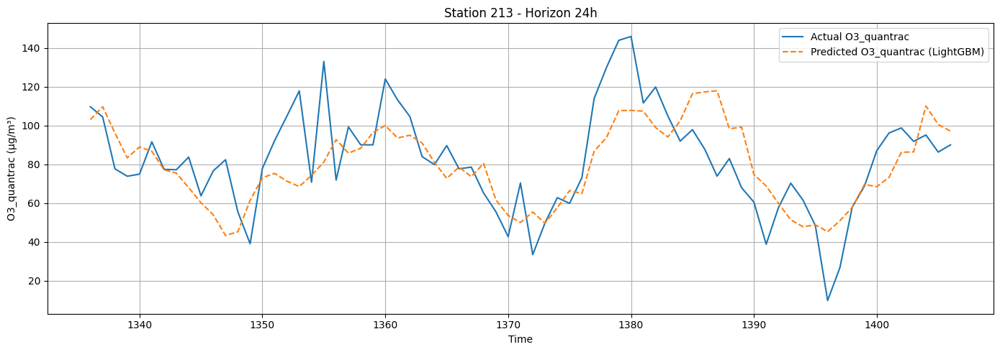

hour = 48


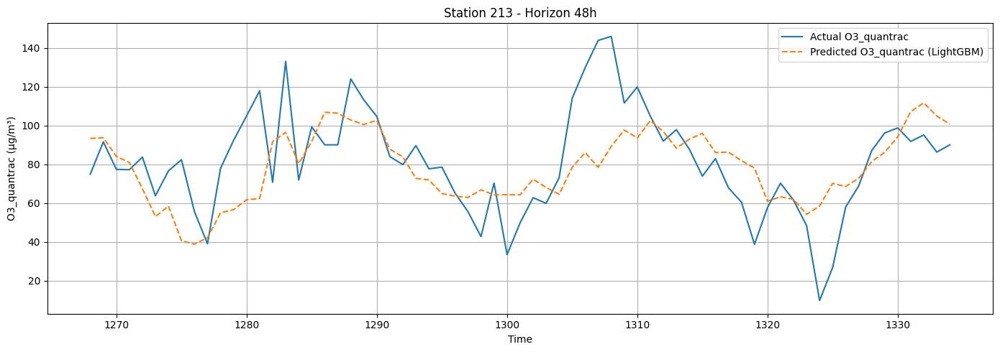

hour = 72


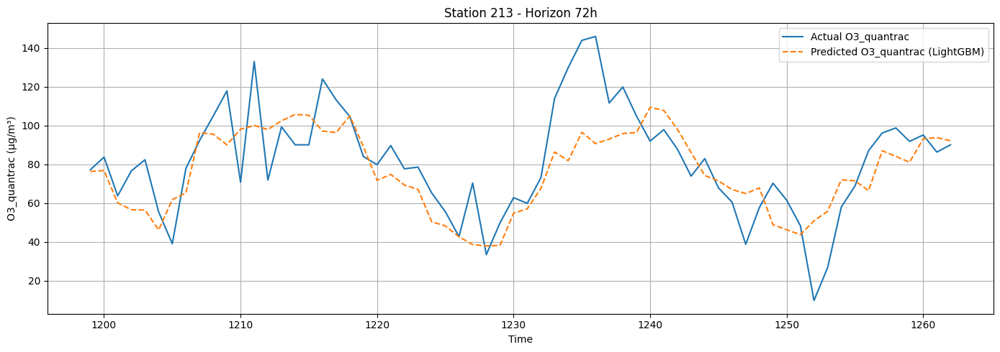

station_id = 216
hour = 1


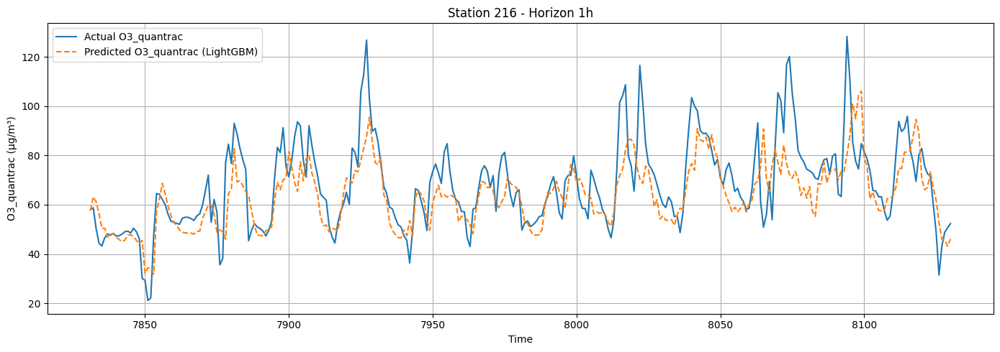

hour = 24


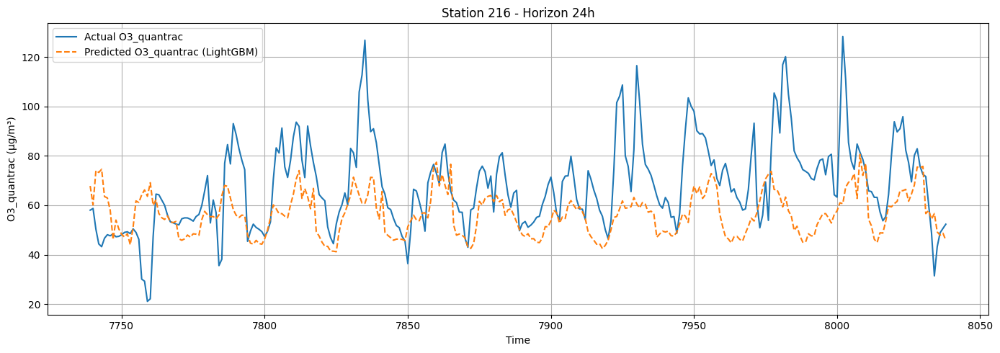

hour = 48


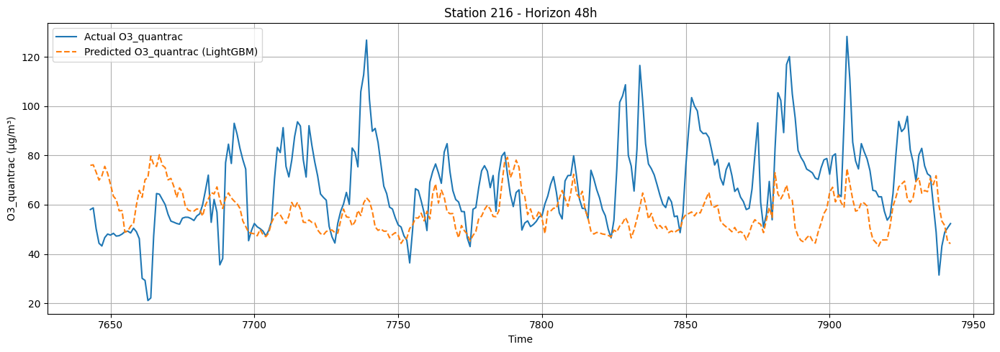

hour = 72


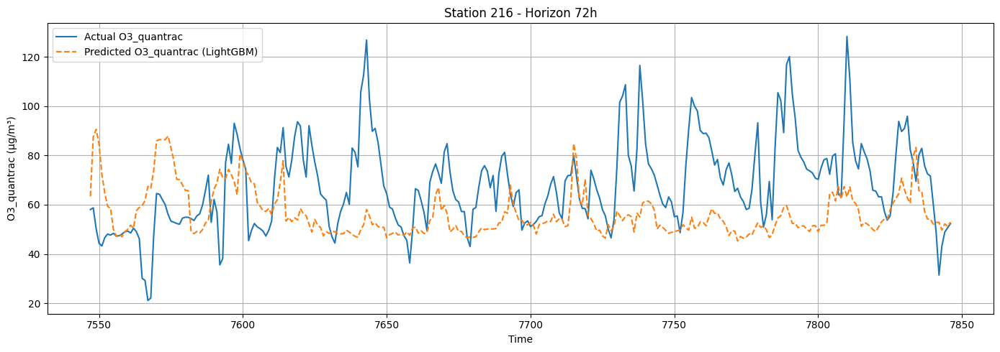

In [26]:
# Reference
for station_id in STATION_IDS:
    print(f"station_id = {station_id}")
    for hour in [1, 24, 48, 72]:
        print(f"hour = {hour}")
        plot_timeseries_example(df_o3, o3_models_by_h[hour], horizon_h=hour, station_id=int(station_id), target_col=label)

## Training for CO

In [27]:
label = "CO_quantrac"

# Add rolling features for LABEL
df_co = add_rolling_features(df_lag_feats, group_col="station_id", target_cols=[label], windows=ROLL_WINDOWS)
print(df_co.columns)

# Start running model
co_all_metrics = []
co_models_by_h = {}
for h in HORIZONS:
    print(f"\n===== Training LightGBM for horizon = {h}h, target_col = {label} =====")
    model_h, metrics_overall, metrics_by_station, _ = train_lgbm_for_horizon(df_co, horizon_h=h, target_col=label)
    co_models_by_h[h] = model_h
    model_h.save_model(os.path.join(LIGHTGBM_DIR, f"{label}_lightgbm_{h}h"))
    print("Overall test metrics:", metrics_overall)
    co_all_metrics.append(metrics_by_station)

co_df_metrics_all = pd.concat(co_all_metrics, ignore_index=True)
co_df_metrics_all = co_df_metrics_all.sort_values(["station", "horizon_h"])
co_df_metrics_all.to_csv(os.path.join(LIGHTGBM_DIR, f"{label}_metrics.csv"))
co_df_metrics_all

Index(['date', 'NO2_quantrac', 'PM25_quantrac', 'O3_quantrac', 'CO_quantrac',
       'Temperature_quantrac', 'Humid_quantrac', 'NO2_cmaq', 'O3_cmaq',
       'SO2_cmaq', 'station_id', 'hour', 'dayofweek', 'month',
       'NO2_quantrac_lag3', 'NO2_quantrac_lag6', 'NO2_quantrac_lag12',
       'NO2_quantrac_lag24', 'PM25_quantrac_lag3', 'PM25_quantrac_lag6',
       'PM25_quantrac_lag12', 'PM25_quantrac_lag24', 'O3_quantrac_lag3',
       'O3_quantrac_lag6', 'O3_quantrac_lag12', 'O3_quantrac_lag24',
       'CO_quantrac_lag3', 'CO_quantrac_lag6', 'CO_quantrac_lag12',
       'CO_quantrac_lag24', 'Temperature_quantrac_lag3',
       'Temperature_quantrac_lag6', 'Temperature_quantrac_lag12',
       'Temperature_quantrac_lag24', 'Humid_quantrac_lag3',
       'Humid_quantrac_lag6', 'Humid_quantrac_lag12', 'Humid_quantrac_lag24',
       'NO2_cmaq_lag3', 'NO2_cmaq_lag6', 'NO2_cmaq_lag12', 'NO2_cmaq_lag24',
       'O3_cmaq_lag3', 'O3_cmaq_lag6', 'O3_cmaq_lag12', 'O3_cmaq_lag24',
       'SO2_cmaq_lag3'

,station,horizon_h,RMSE,MAE,MBE,MNBE,r,n_samples
0,211,1,27.741427,22.966161,16.893857,2.362904,0.489771,74
4,211,24,106.045837,103.550579,103.308907,14.246837,-0.027912,71
8,211,48,131.038554,128.919431,128.919431,17.759122,-0.126035,67
12,211,72,120.650741,118.319142,118.319142,16.325266,0.045640,64
1,212,1,34.311546,25.055301,-6.901702,-11.956602,-0.036725,74
5,212,24,168.591549,167.543161,167.543161,182.063316,0.083045,71
9,212,48,249.743050,249.048477,249.048477,272.242918,NaN,67
13,212,72,213.809522,212.961551,212.961551,231.936446,NaN,64
2,213,1,316.648802,210.129469,-42.060346,37.641972,0.438600,74
6,213,24,424.292995,336.391684,159.212168,71.714709,-0.283655,71


station_id = 211
hour = 1


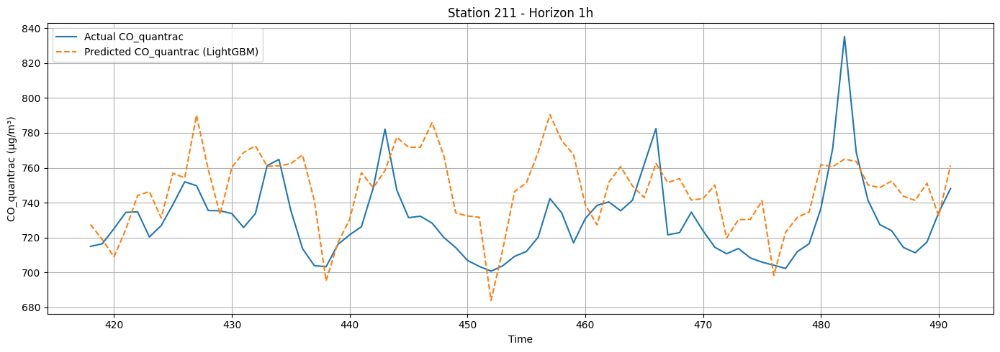

hour = 24


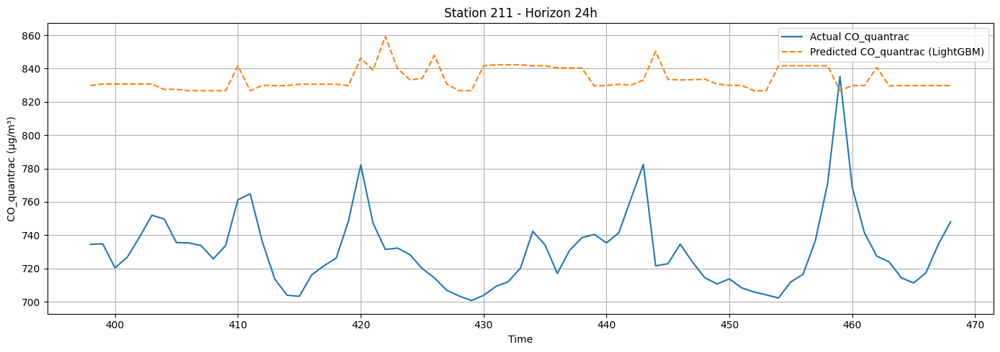

hour = 48


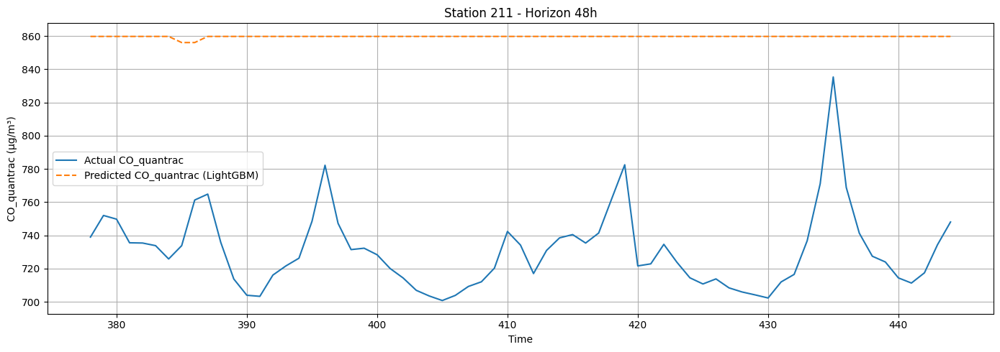

hour = 72


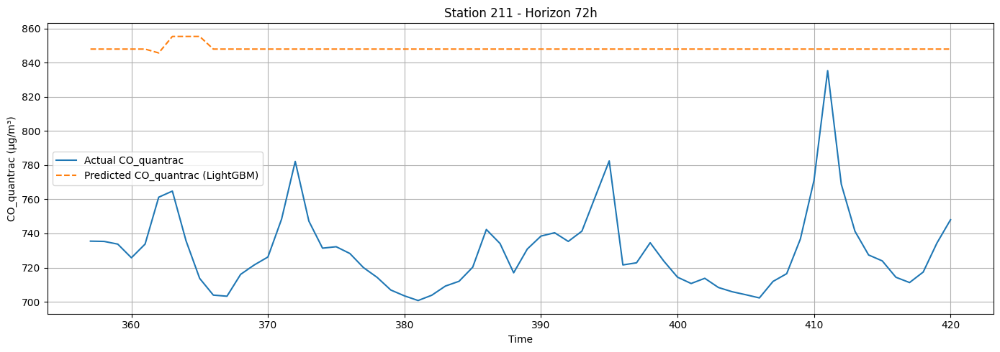

station_id = 212
hour = 1


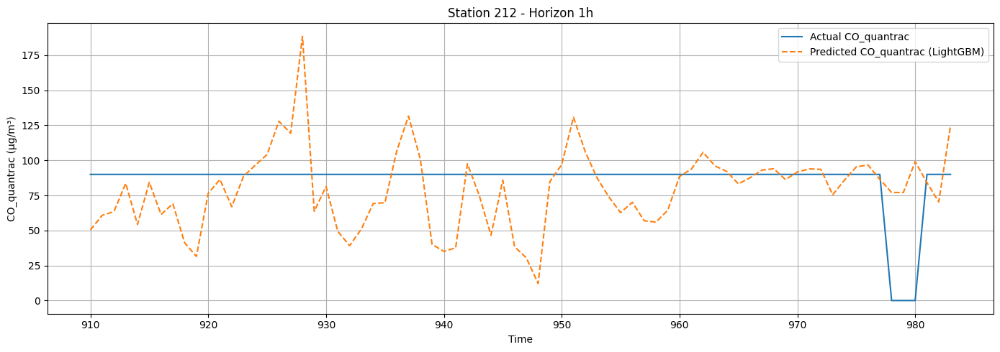

hour = 24


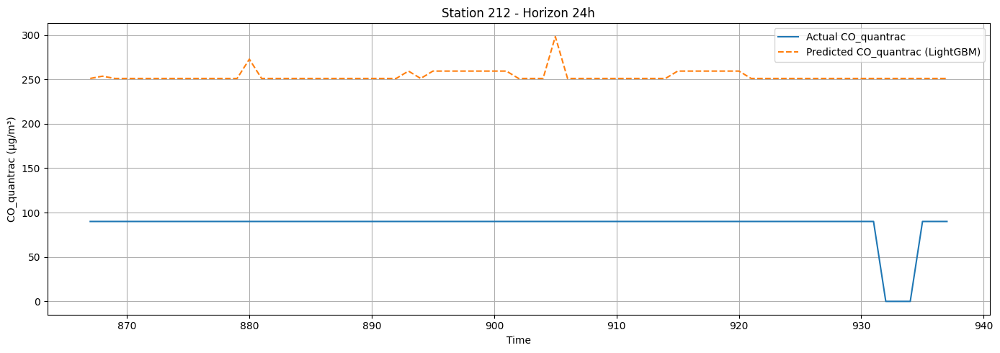

hour = 48


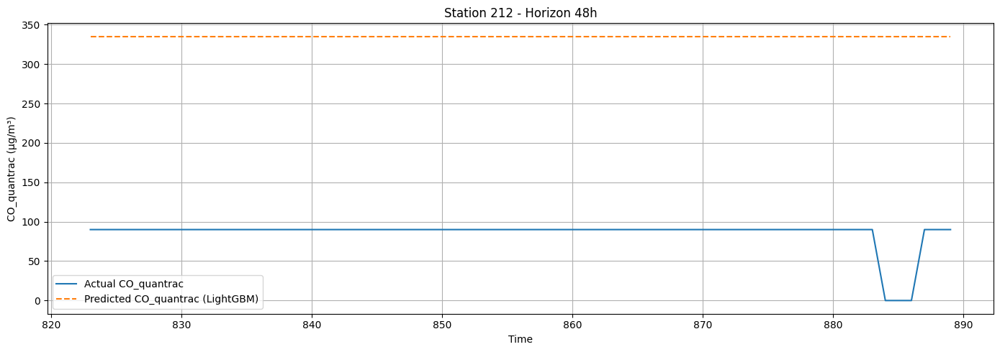

hour = 72


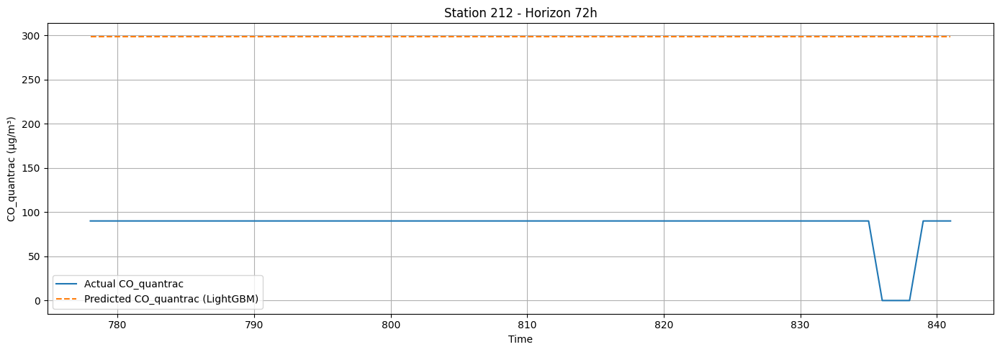

station_id = 213
hour = 1


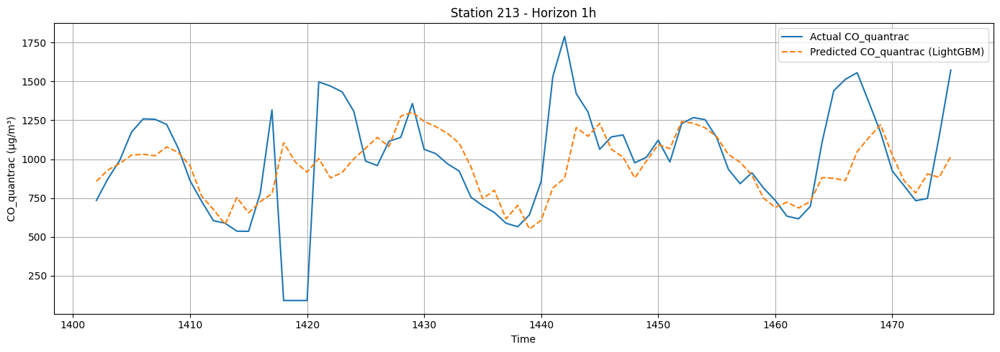

hour = 24


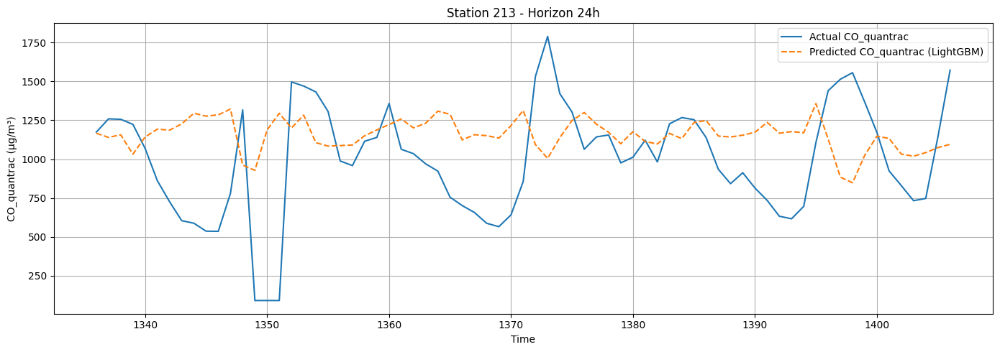

hour = 48


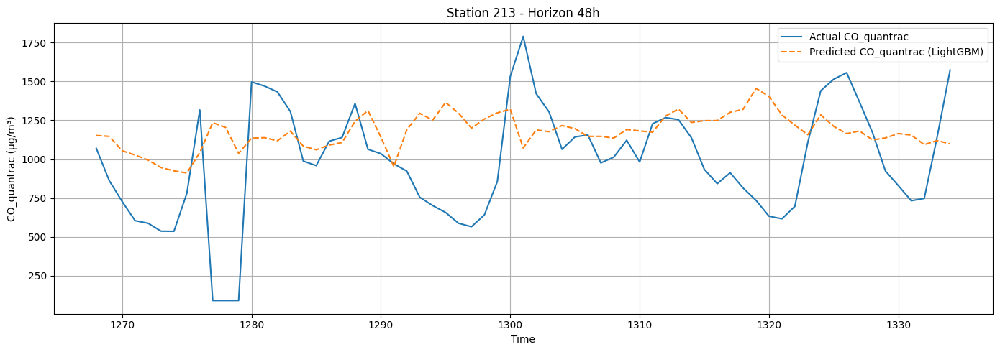

hour = 72


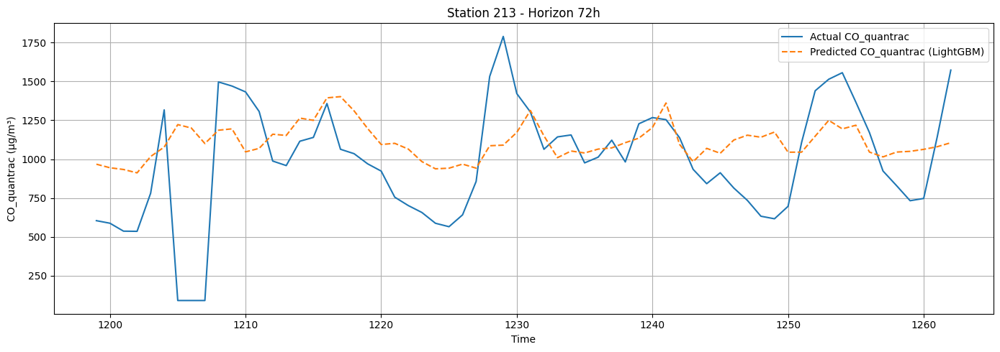

station_id = 216
hour = 1


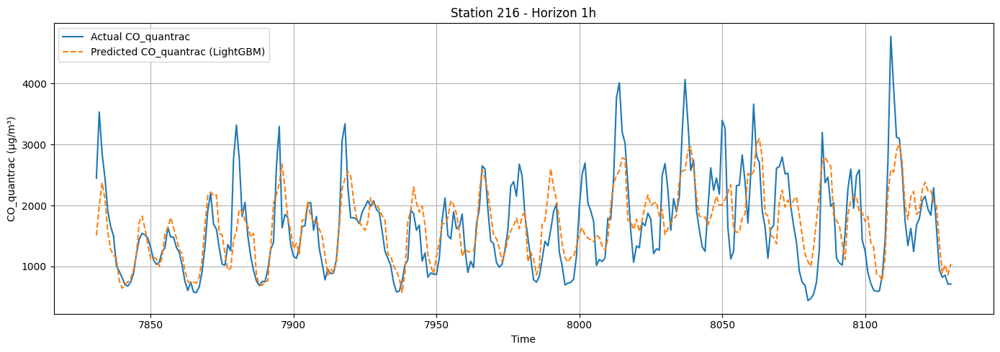

hour = 24


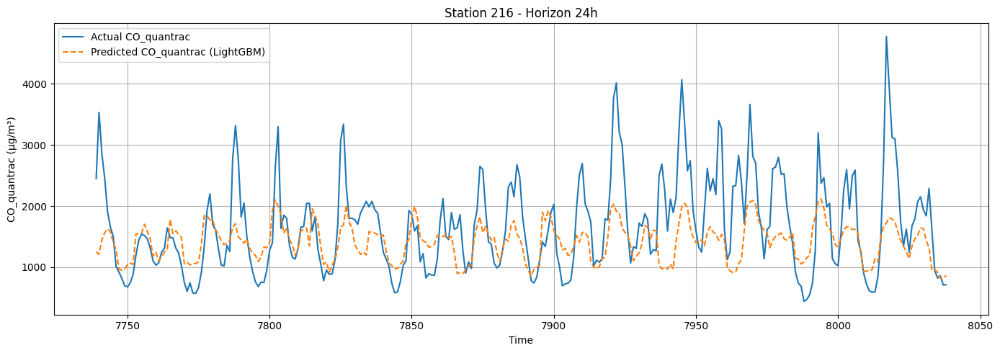

hour = 48


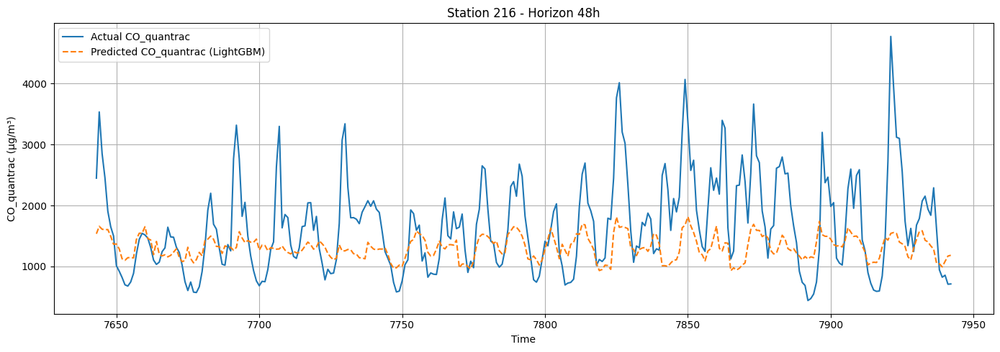

hour = 72


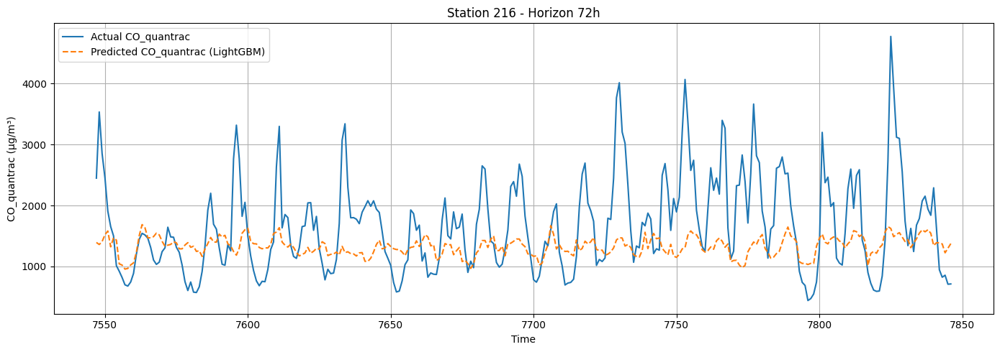

In [28]:
# Reference
for station_id in STATION_IDS:
    print(f"station_id = {station_id}")
    for hour in [1, 24, 48, 72]:
        print(f"hour = {hour}")
        plot_timeseries_example(df_co, co_models_by_h[hour], horizon_h=hour, station_id=int(station_id), target_col=label)